# Pipeline for AGEP column

Enable auto-reloading of external modules

In [48]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Import dependencies

In [49]:
import pandas as pd
from pprint import pprint
from functools import partial
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

from config import *
from utils.NullPredictor import NullPredictor
from utils.NullImputer import NullImputer
from utils.null_helpers import base_regressor, base_knn, base_random_forest
from utils.data_loader import *
from utils.null_handler import *
from utils.EDA_utils import *
from utils.simple_utils import *
from utils.model_tuning_utils import *
from utils.stability_analysis import *
from utils.analysis_helper import *
from utils.StabilityFairnessAnalyzer import StabilityFairnessAnalyzer

import os
import warnings
warnings.filterwarnings('ignore')
os.environ["PYTHONWARNINGS"] = "ignore"

plt.style.use('mpl20')
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams.update({'font.size': 10})

In [50]:
try:
    from folktables import ACSDataSource, ACSEmployment
except:
    !pip install folktables
    from folktables import ACSDataSource, ACSEmployment

## Loading ACSEmployment data

In [51]:
TARGET_COLUMN = 'AGEP'
NULL_SCENARIO_NAME = f'Unknown_{TARGET_COLUMN}'
COLUMN_TYPE = get_column_type(TARGET_COLUMN)

In [52]:
X_data, y_data = ACSDataLoader(task=DATASET_CONFIG['task'], state=DATASET_CONFIG['state'], year=DATASET_CONFIG['year'], without_nulls=True)

Original: 24 mb
Optimized: 12 mb

Dataset shape before handling nulls:  (196967, 16)
Impute values:  {'SCHL': 0, 'ESP': 0, 'MIG': 0, 'MIL': 0, 'DREM': 0}
Dataset shape after handling nulls:  (196967, 16)

Rechecking if there are nulls in X_data:
AGEP        0
SCHL        0
MAR         0
RELP        0
DIS         0
ESP         0
CIT         0
MIG         0
MIL         0
ANC         0
NATIVITY    0
DEAR        0
DEYE        0
DREM        0
SEX         0
RAC1P       0
dtype: int64


Check how the target column is balanced

In [53]:
y_data.value_counts()

0    105498
1     91469
Name: ESR, dtype: int64

## Tune hyper-parameters and find the best model

### The best model for a baseline dataset (no nulls)

In [54]:
ML_baseline_results_df = pd.read_csv(os.path.join('..', 'results', 'ML_baseline_results_df.csv'))
ML_baseline_results_df

,Unnamed: 0,Dataset_Name,Model_Name,F1_Score,Accuracy_Score,Model_Best_Params
0,0,Folktables [NY 2018],LogisticRegression,0.7998,0.7999,"{'max_iter': 100, 'penalty': 'l2', 'solver': '..."
1,1,Folktables [NY 2018],DecisionTreeClassifier,0.8229,0.8230,"{'criterion': 'entropy', 'max_depth': 10, 'max..."
2,2,Folktables [NY 2018],XGBClassifier,0.8296,0.8297,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti..."


## Simulate Null Scenarios

In [55]:
corrupted_data = simulate_scenario(X_data, SIMULATED_SCENARIOS_DICT[NULL_SCENARIO_NAME])

## Impute Nulls

Impute a null scenario with all null-handling techniques

In [56]:
input_columns = [col for col in corrupted_data.columns if col != TARGET_COLUMN]
X_train, X_test, y_train, y_test = train_test_split(corrupted_data, y_data, test_size=TEST_SET_FRACTION, random_state=SEED)

In [57]:
null_handling_procedures = {
    "Special": NullImputer([TARGET_COLUMN], how="special", trimmed=0, conditional_column=None, special_value=0),
    "Mean" : NullImputer([TARGET_COLUMN], how="mean", trimmed=0, conditional_column=None),
    "Trimmed-mean": NullImputer([TARGET_COLUMN], how="mean", trimmed=10, conditional_column=None),
    "Sex-conditional-mean": NullImputer([TARGET_COLUMN], how="mean", trimmed=0, conditional_column='SEX'),
    "Race-conditional-mean": NullImputer([TARGET_COLUMN], how="mean", trimmed=0, conditional_column='RAC1P'),
    "Median" : NullImputer([TARGET_COLUMN], how="median", trimmed=0, conditional_column=None),
    "Trimmed-median": NullImputer([TARGET_COLUMN], how="median", trimmed=10, conditional_column=None),
    "Sex-conditional-median": NullImputer([TARGET_COLUMN], how="median", trimmed=0, conditional_column='SEX'),
    "Race-conditional-median": NullImputer([TARGET_COLUMN], how="median", trimmed=0, conditional_column='RAC1P'),
    "Regression": NullPredictor(base_classifier=partial(base_regressor), target_columns=[TARGET_COLUMN],
                                input_columns = input_columns, categorical_columns=COLUMN_TO_TYPE['categorical'],
                                numerical_columns=COLUMN_TO_TYPE['numerical']),
    "kNN": NullPredictor(base_classifier=partial(base_knn, n_neighbors=5), target_columns=[TARGET_COLUMN],
                          input_columns = input_columns, categorical_columns=COLUMN_TO_TYPE['categorical'],
                          numerical_columns=COLUMN_TO_TYPE['numerical']),
    "RandomForest": NullPredictor(base_classifier=partial(base_random_forest, n_estimators=100, max_depth=20), target_columns=[TARGET_COLUMN],
                                  input_columns = input_columns, categorical_columns=COLUMN_TO_TYPE['categorical'],
                                  numerical_columns=COLUMN_TO_TYPE['numerical'])
}

In [58]:
imputed_data_dict = dict()
null_idx = np.where(X_test[TARGET_COLUMN].isnull())[0]
X_data_aligned = X_data.iloc[corrupted_data.index]
# For each imputation technique, impute nulls in corrupted train and test sets,
# create test groups based on the test set and
# prepare feature sets for future prediction
for procedure in null_handling_procedures.keys():
    print("\n\n", "*" * 20, f" {procedure} ","*" * 20)
    null_handler = null_handling_procedures[procedure]

    X_train_imputed = null_handler.fit_transform(X_train)
    X_test_imputed = null_handler.transform(X_test, X_data_aligned[TARGET_COLUMN].iloc[null_idx])
    test_groups = load_groups_of_interest(os.path.join('..', 'groups.json'), X_test_imputed)

    encoder = ColumnTransformer(transformers=[
        ('categorical_features', OneHotEncoder(handle_unknown='ignore', sparse=False), COLUMN_TO_TYPE['categorical']),
        ('numerical_features', StandardScaler(), COLUMN_TO_TYPE['numerical'])
    ])
    X_train_features = encoder.fit_transform(X_train_imputed)
    X_test_features = encoder.transform(X_test_imputed)
    imputed_data_dict[procedure] = {'X_data': (X_train_features, X_test_features), 'test_groups': test_groups}



 ********************  Special  ********************


 ********************  Mean  ********************


 ********************  Trimmed-mean  ********************


 ********************  Sex-conditional-mean  ********************


 ********************  Race-conditional-mean  ********************


 ********************  Median  ********************


 ********************  Trimmed-median  ********************


 ********************  Sex-conditional-median  ********************


 ********************  Race-conditional-median  ********************


 ********************  Regression  ********************
Train set shape:  (156008, 15)
Fit score:  0.7511828216999914
Test set shape:  (1565, 15)
Test set shape:  (393, 15)
Model prediction score:  -0.3155641642010816
Prediction RMSE score:  28.014899707083806
Prediction MAE score:  22.793893129770993


 ********************  kNN  ********************
Train set shape:  (156008, 15)
Fit score:  0.7753713180184959
Test set shape:  (156

In [ ]:
imputed_with_datawig_full_df = pd.read_csv(os.path.join('..', 'results', 'imputed_with_datawig_full_df.csv'))
imputed_with_datawig_full_df.drop('Unnamed: 0', axis=1, inplace=True)
imputed_with_datawig_full_df.head()

In [ ]:
# Add some extra imputation techniques
for procedure, source_df in [('datawig', imputed_with_datawig_full_df), ('baseline', X_data)]:
    X_train_imputed, X_test_imputed = train_test_split(source_df, test_size=TEST_SET_FRACTION, random_state=SEED)
    test_groups = load_groups_of_interest(os.path.join('..', 'groups.json'), X_test_imputed)
    encoder = ColumnTransformer(transformers=[
        ('categorical_features', OneHotEncoder(handle_unknown='ignore', sparse=False), COLUMN_TO_TYPE['categorical']),
        ('numerical_features', StandardScaler(), COLUMN_TO_TYPE['numerical'])
    ])
    X_train_features = encoder.fit_transform(X_train_imputed)
    X_test_features = encoder.transform(X_test_imputed)
    imputed_data_dict[procedure] = {'X_data': (X_train_features, X_test_features), 'test_groups': test_groups}

## Quantifying uncertainty using posterior predictive distribution

In [ ]:
matplotlib.rcParams.update({'font.size': 14})
imputation_techniques = list(imputed_data_dict.keys())
imputation_techniques

### Plots notes

Notes is based on [this paper](https://www.osti.gov/servlets/purl/1527311).

**Probability mean vs Standard deviation**
* The closer a sample is to the decision boundary, the more likely that small changes in the input data or parameters will change the predicted class.
* To gain a general understanding about the relative instability of individual classifications, we calculate the absolute difference between the number of times a sample is classified as employed or not employed and call this calculation **label stability**.
* When a sample is close to the boundary of a decision surface, perturbations in the data often cause the classifiers' to label the sample differently. Identifying which samples fall into this range, allows us to measure the relative stability of an individual classification.


**Standard deviation vs Label stability and Probability mean vs Label stability**
* Shows the correlation between probability mean, standard deviation and label stability.
* Label stability is defined as the absolute difference between the number of times the sample is classified as 0 and 1.
    * If the absolute difference is large, the label is more stable
    * If the difference is exactly zero then it's extremely unstable --- equally likely to be classified as 0 or 1


**Accuracy vs Standard deviation**
* When it is given the same label with a probability of 100%, each tree's classification of a sample is a binary decision. With 100 trees, each giving 100% probability to its prediction, the calculations of mean and standard deviation can **only result in certain values.** In this case the plot should have a shape of an arc, like here:

![image](https://user-images.githubusercontent.com/42843889/180245566-2312a79d-977f-4a56-89ac-1404c807b80e.png)

* For example for kNN based on this kind of plot, we can notice that as the number of neighbors increase, the stability of the classifiers increases, so there are lower standard deviation values. The standard deviation values show less correlation to accuracy as the number of neighbors increases. The overall accuracy is also decreased suggesting that the models are underfitting the training data.


**Accuracy vs Interquartile range**
* The interquartile range provides a measure of variability as the difference between the third and first quartiles.


In [60]:
y_data_tpl = (y_train, y_test)

def get_evaluation_model():
    # Set hyper-parameters for the best model. Use hyper-parameters, which were tuned on a drop-column dataset
    ML_drop_column_results_df = pd.read_csv(os.path.join('..', 'results', f'{NULL_SCENARIO_NAME}_ML_drop_column_results_df.csv'))
    hyperparameters_dict = eval(ML_drop_column_results_df.loc[ML_drop_column_results_df['Model_Name'] == 'DecisionTreeClassifier',
                                                              'Model_Best_Params'].iloc[0])
    return DecisionTreeClassifier(criterion=hyperparameters_dict['criterion'],
                                  max_depth=hyperparameters_dict['max_depth'],
                                  max_features=hyperparameters_dict['max_features'])


def get_analyzer(imputation_technique, imputed_data_dict=imputed_data_dict, y_data_tpl=y_data_tpl):
    evaluation_model = get_evaluation_model()
    return StabilityFairnessAnalyzer(imputed_data_dict[imputation_technique]['X_data'], y_data_tpl,
                                     imputed_data_dict[imputation_technique]['test_groups'], evaluation_model,
                                     imputation_technique, NULL_SCENARIO_NAME, n_estimators=200)


### Baseline technique

In [ ]:
imputation_technique = 'baseline'
baseline_analyzer = get_analyzer(imputation_technique)
baseline_analyzer.measure_metrics()

### Datawig imputation technique

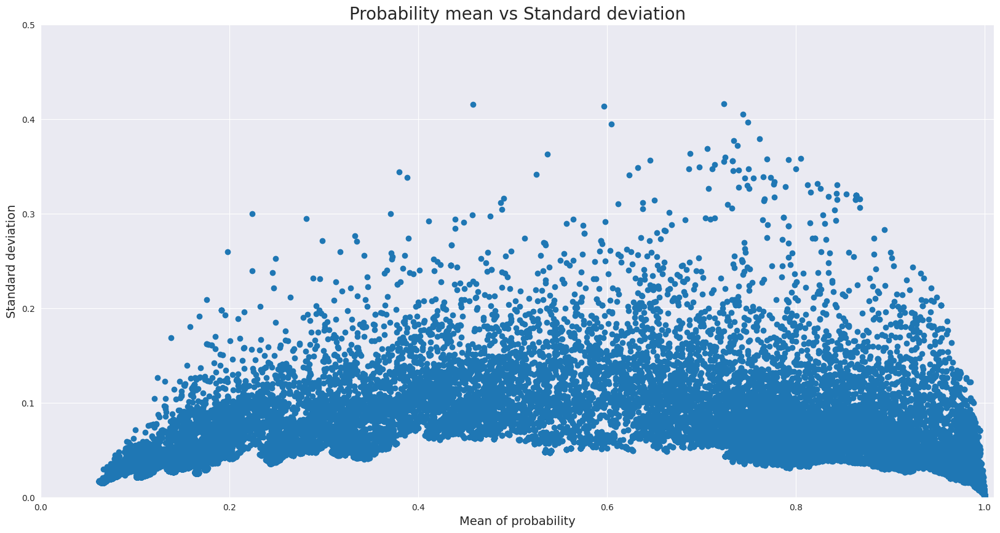

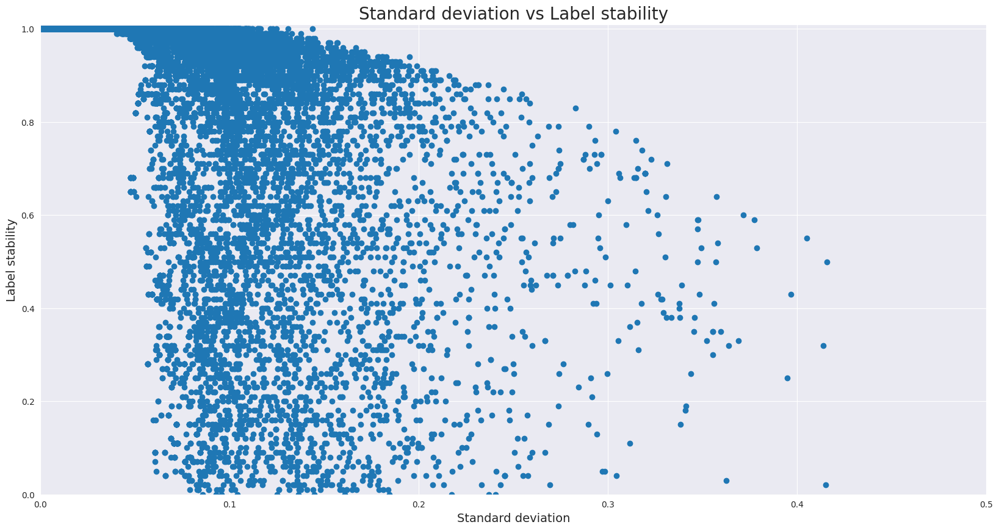

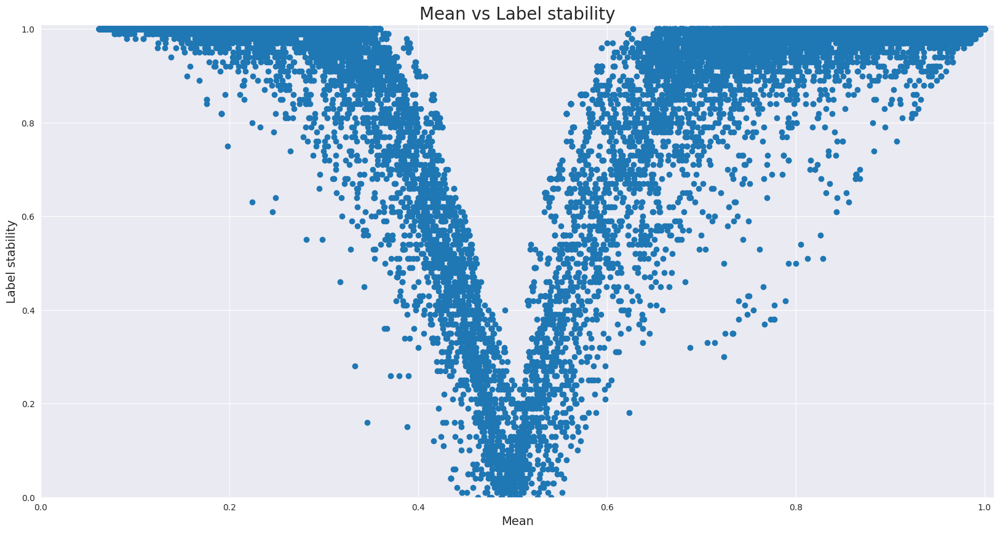

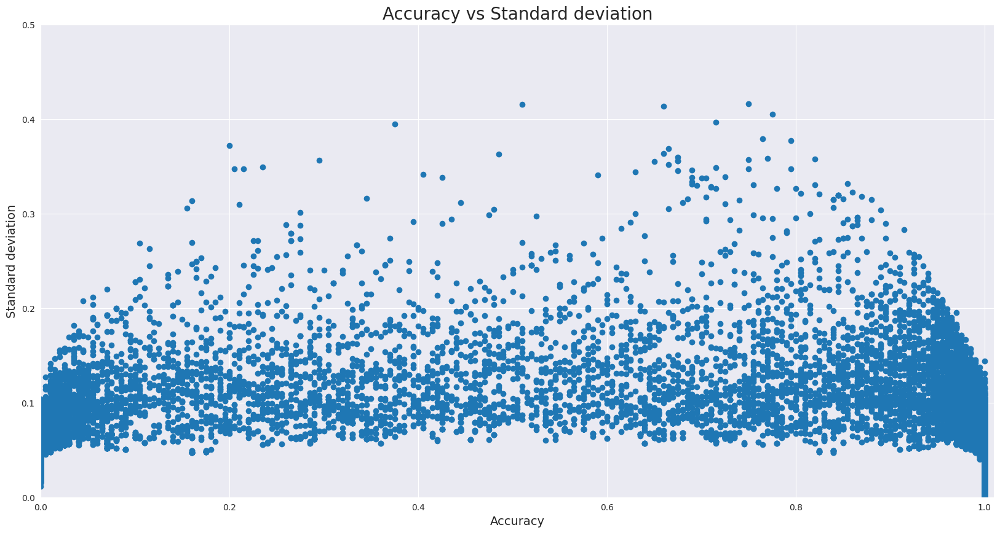

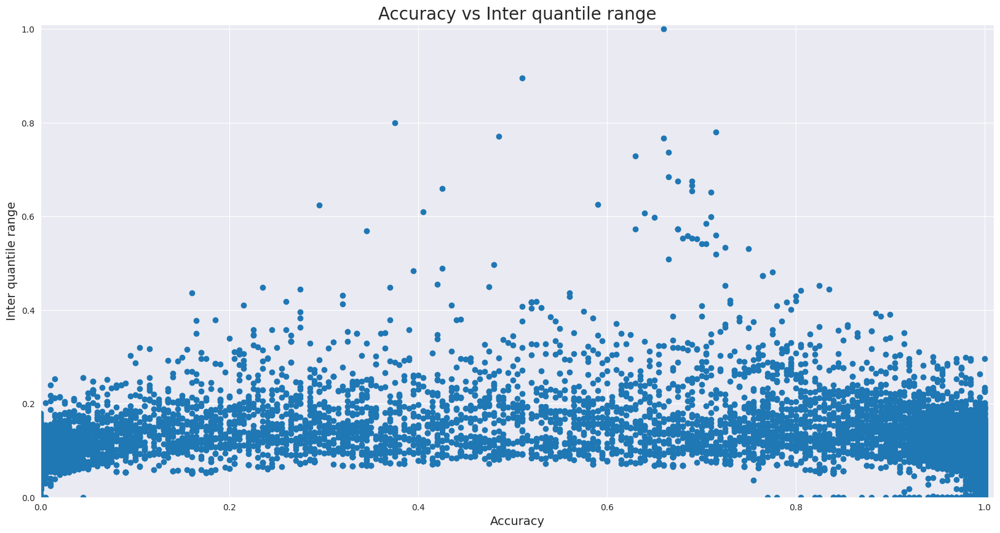

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.829355  0.845237  0.844006
disadv    0.822360  0.808353  0.802834
Accuracy  0.006995  0.036884  0.041172

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.513010  0.516473  0.521309
disadv            0.482044  0.512412  0.507287
Disparate_Impact  0.939639  0.992139  0.973104

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.860763  0.871401  0.862716
disadv             0.858871  0.861494  0.848182
Equal_Opportunity  0.001892  0.009906  0.014535

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            1.081159  1.060619  1.035201
disadv             

In [39]:
imputation_technique = 'datawig'
datawig_analyzer = get_analyzer(imputation_technique)
datawig_analyzer.measure_metrics()

### RandomForest imputation technique

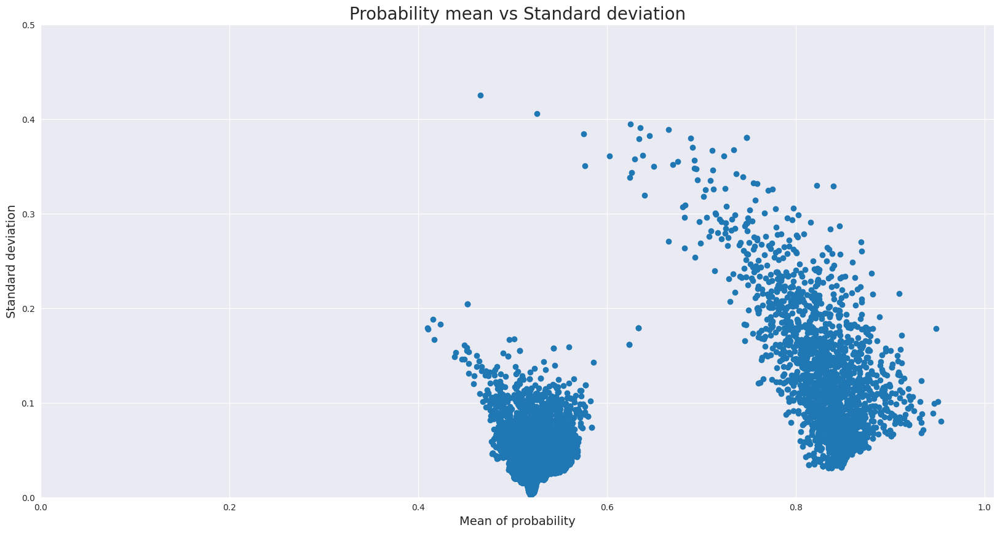

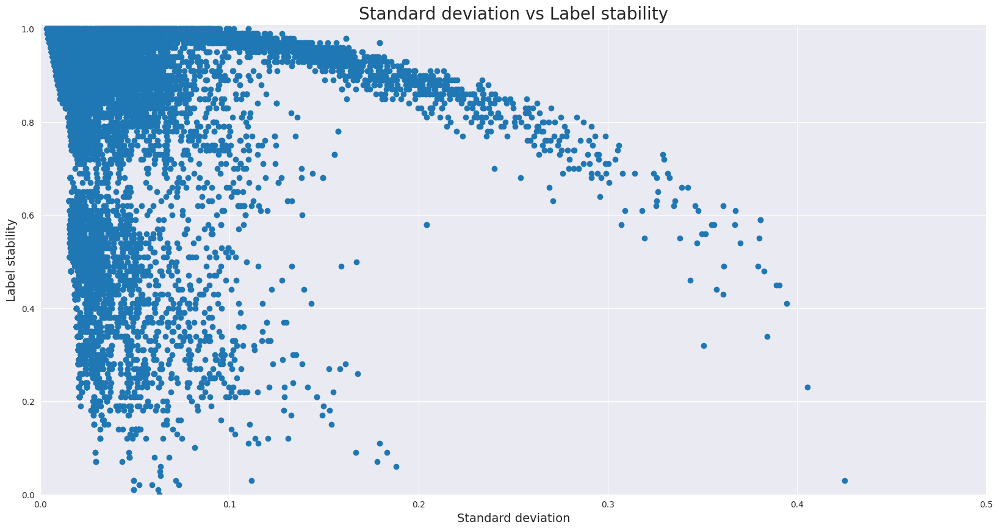

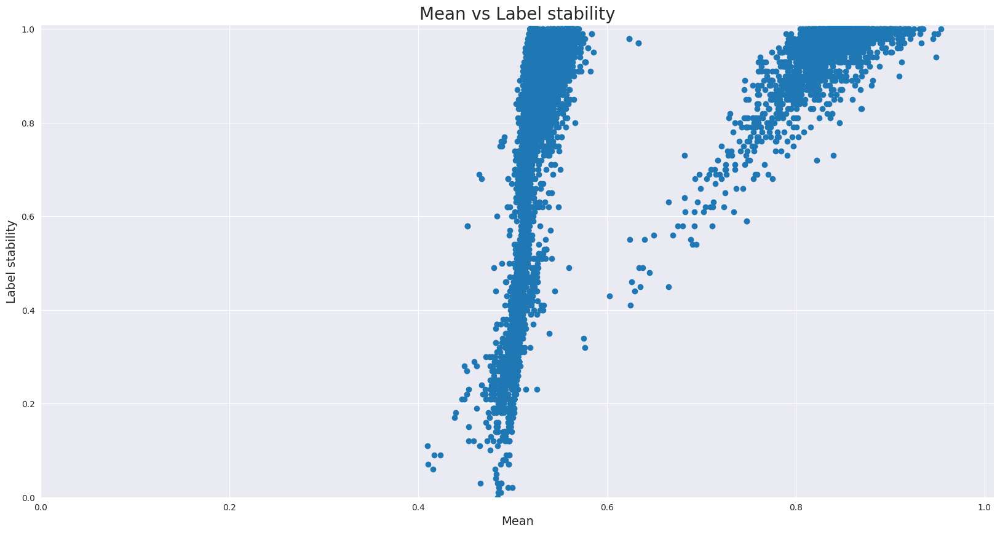

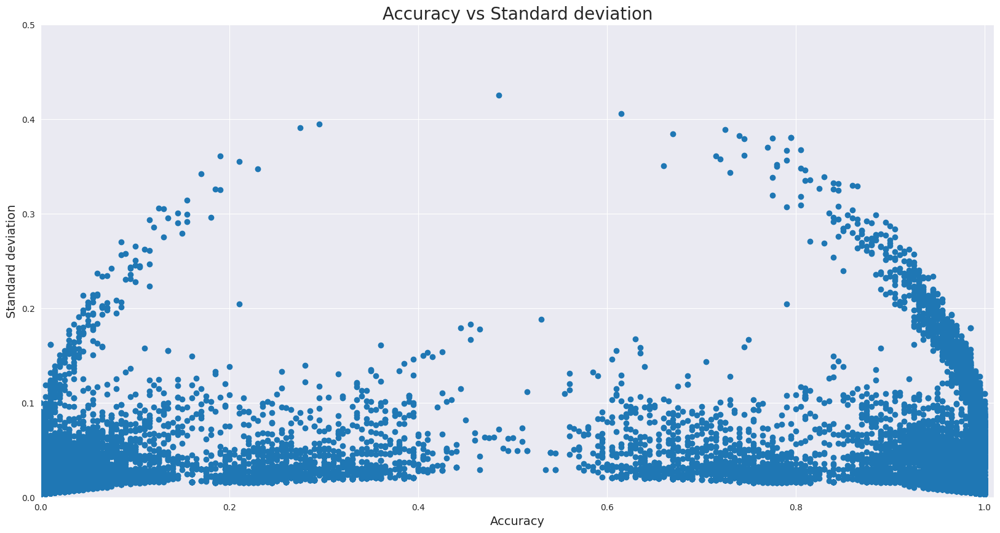

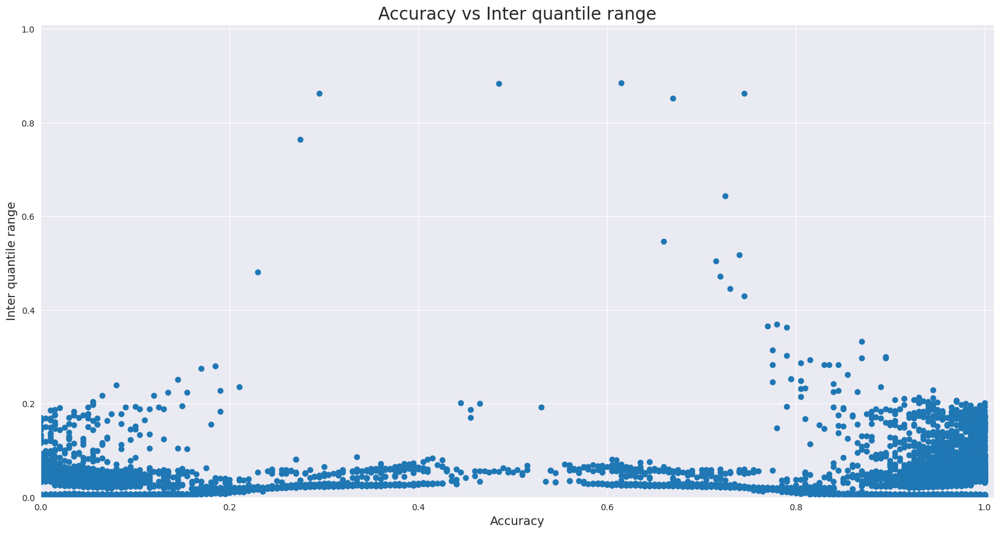

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.532272  0.533988  0.531033
disadv    0.542751  0.535711  0.546610
Accuracy -0.010479 -0.001723 -0.015577

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.008575  0.010139  0.008054
disadv            0.006815  0.010757  0.005393
Disparate_Impact  0.794838  1.061029  0.669612

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.008596  0.010492  0.008199
disadv             0.004543  0.010705  0.003416
Equal_Opportunity  0.004053 -0.000213  0.004783

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.018354  0.021773  0.017187
disadv             

In [61]:
imputation_technique = 'RandomForest'
random_forest_analyzer = get_analyzer(imputation_technique)
random_forest_analyzer.measure_metrics()

### kNN imputation technique

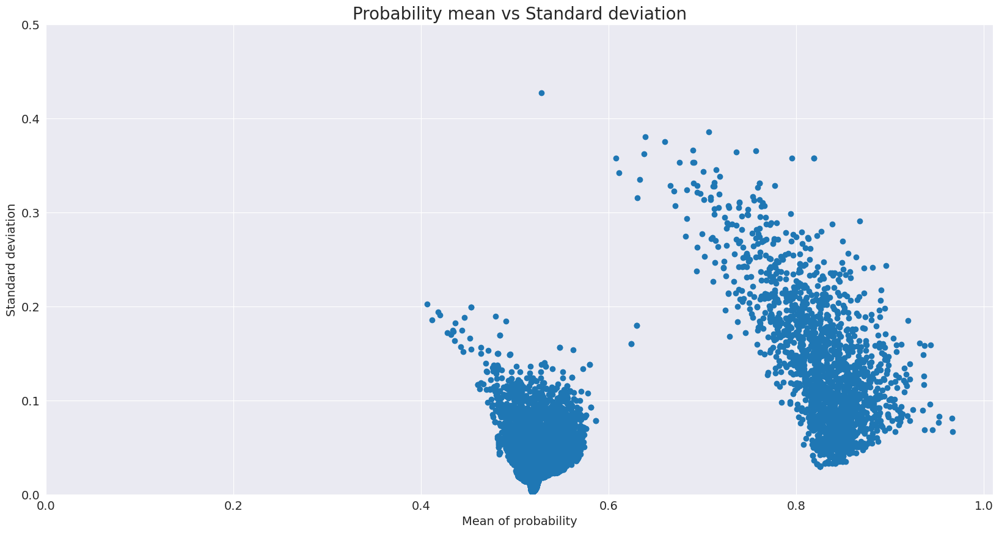

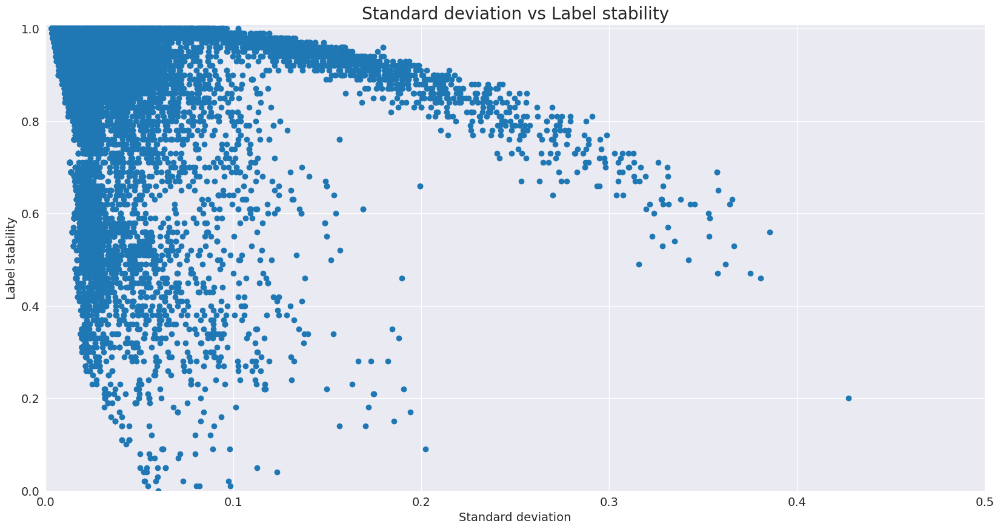

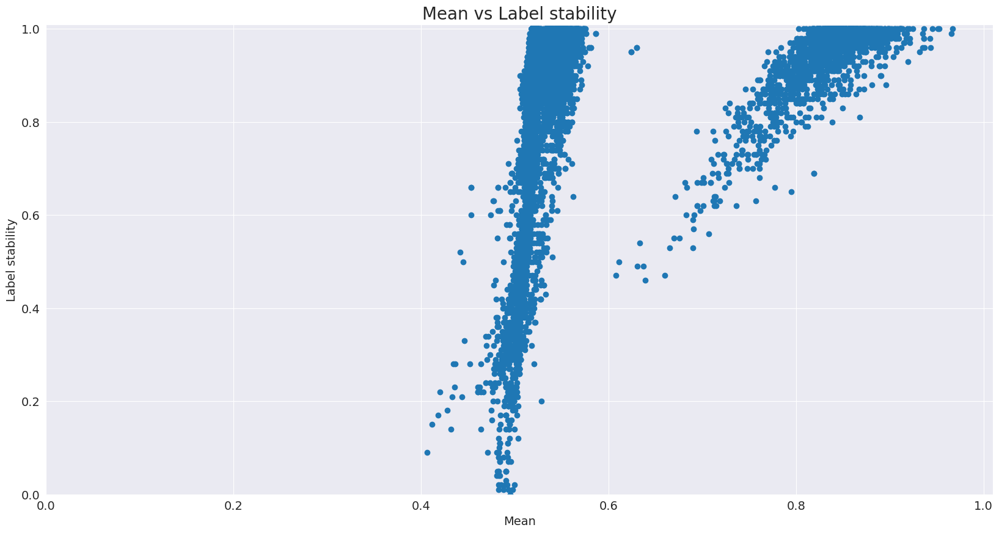

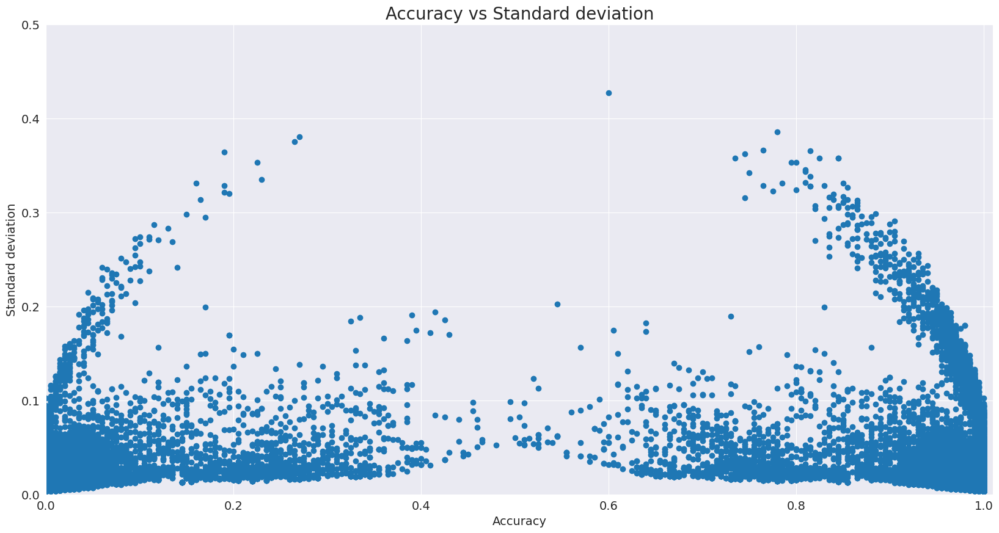

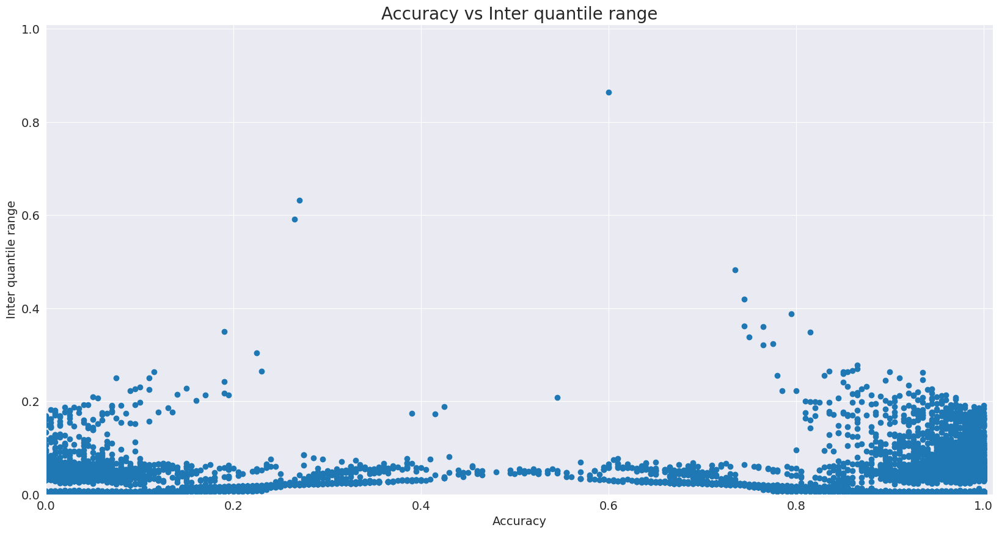

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.532489  0.534146  0.531107
disadv    0.542544  0.535662  0.545840
Accuracy -0.010055 -0.001516 -0.014733

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.007417  0.009456  0.007980
disadv            0.007848  0.008056  0.006163
Disparate_Impact  1.058140  0.851946  0.772356

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.007589  0.009928  0.008199
disadv             0.005452  0.007737  0.003416
Equal_Opportunity  0.002137  0.002191  0.004783

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.015875  0.020307  0.017029
disadv             

In [35]:
imputation_technique = 'kNN'
kNN_analyzer = get_analyzer(imputation_technique)
kNN_analyzer.measure_metrics()

### Regression imputation technique

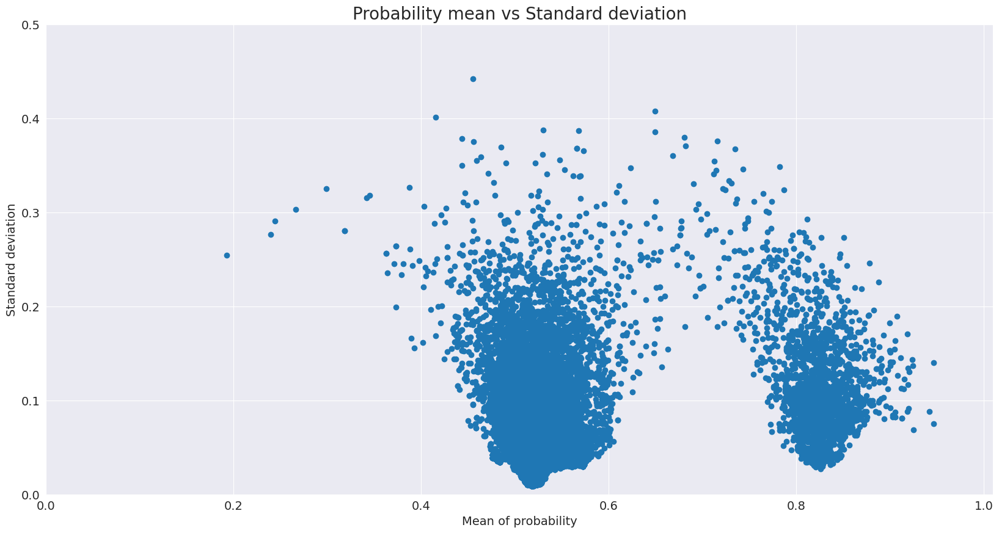

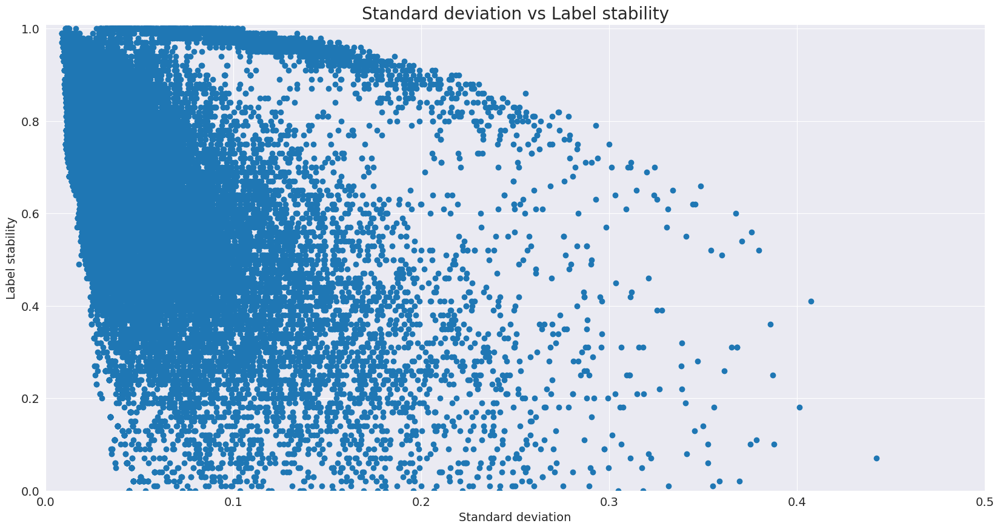

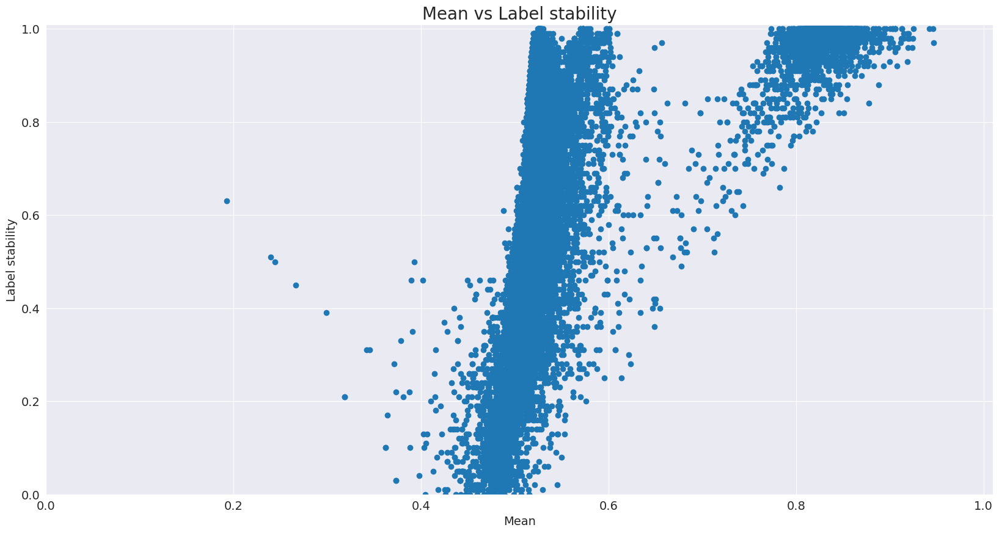

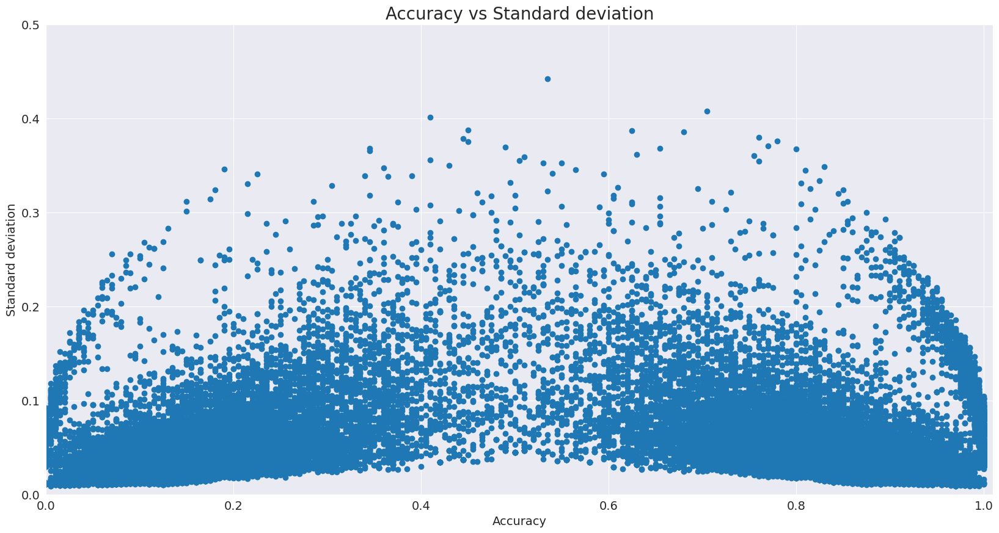

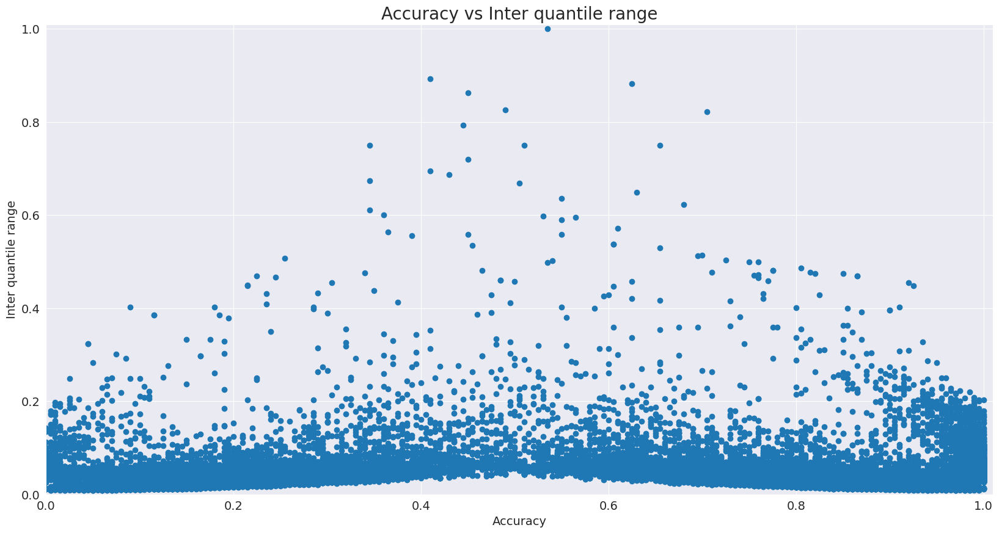

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.530318  0.531152  0.528595
disadv    0.541099  0.533599  0.546225
Accuracy -0.010780 -0.002447 -0.017630

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.048372  0.046701  0.044037
disadv            0.037794  0.054819  0.035824
Disparate_Impact  0.781327  1.173824  0.813501

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.049098  0.046706  0.043992
disadv             0.036801  0.055962  0.036721
Equal_Opportunity  0.012296 -0.009256  0.007272

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.103539  0.100293  0.093977
disadv             

In [31]:
imputation_technique = 'Regression'
regression_analyzer = get_analyzer(imputation_technique)
regression_analyzer.measure_metrics()

### Impute-by-mean technique

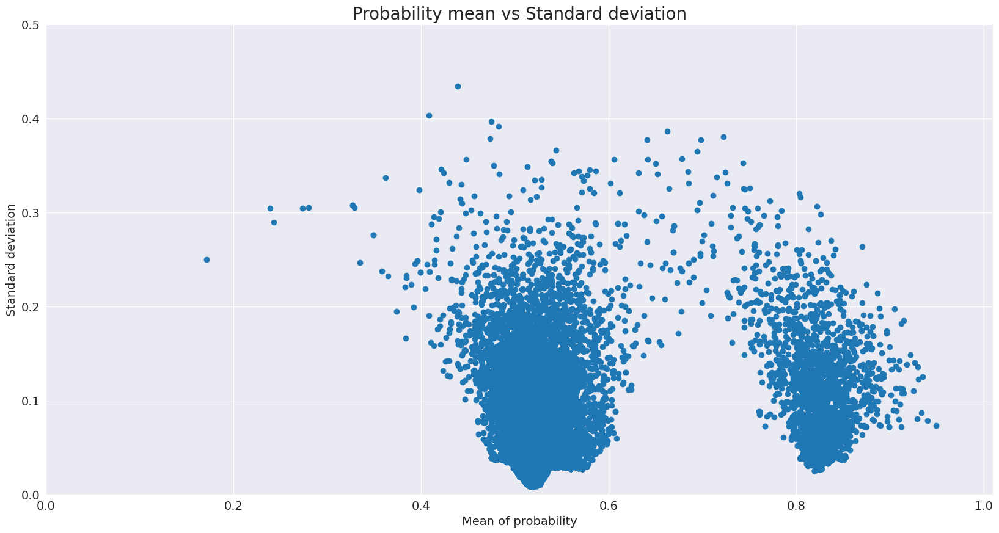

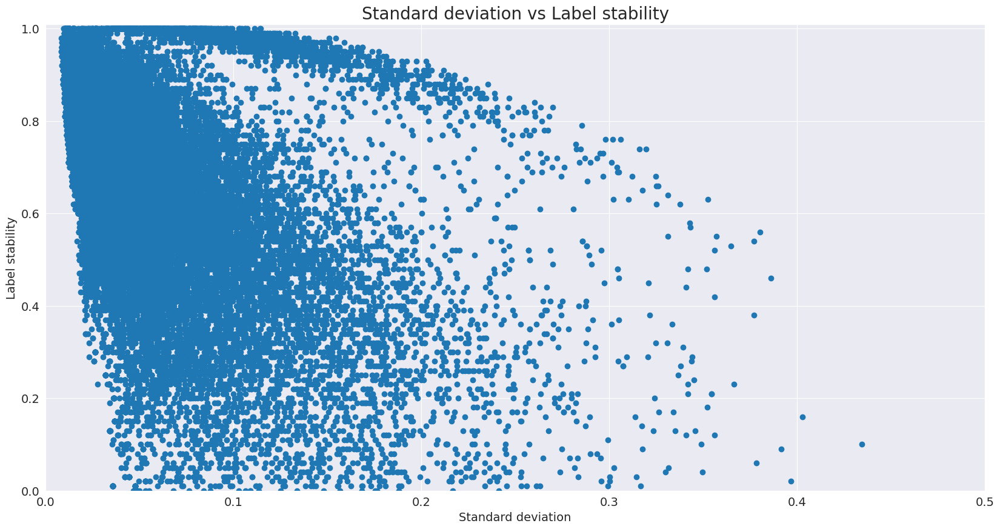

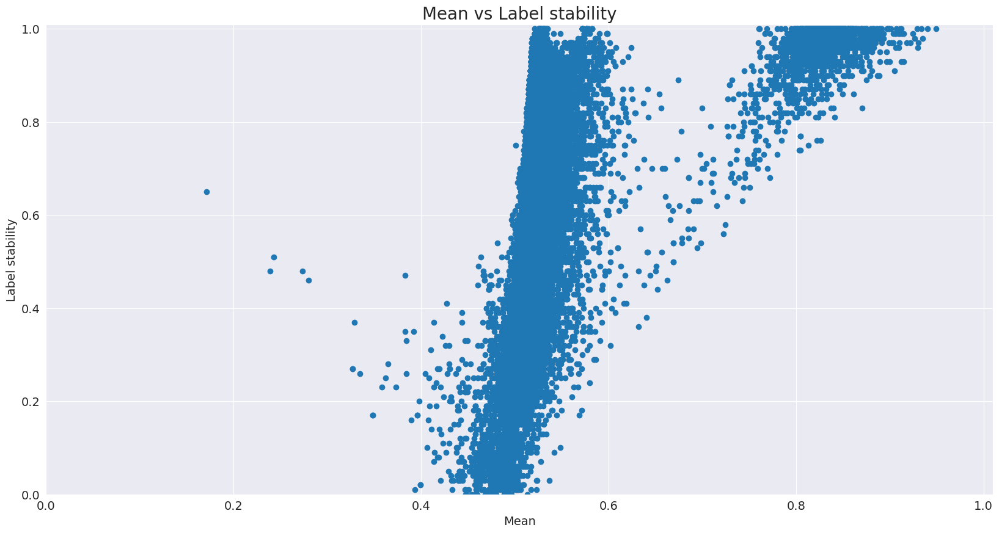

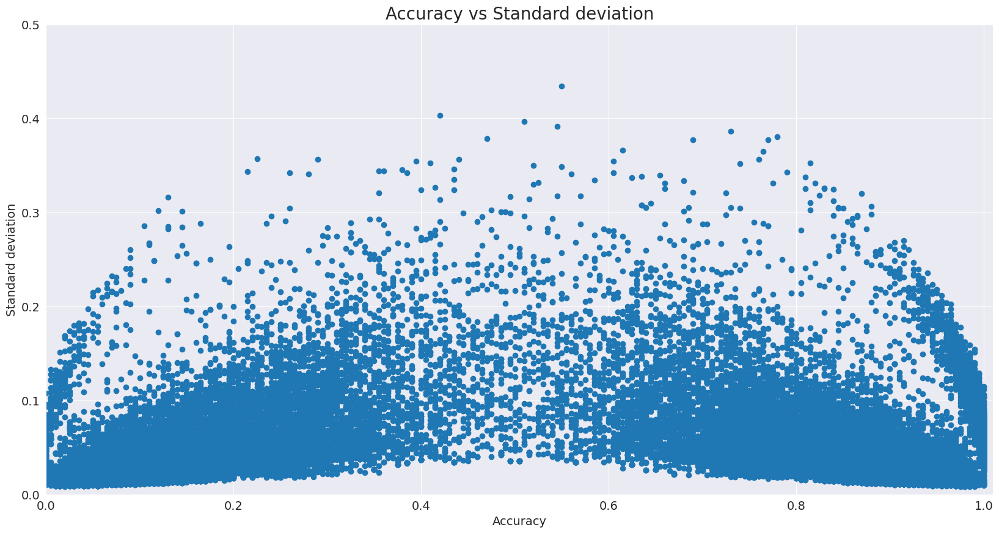

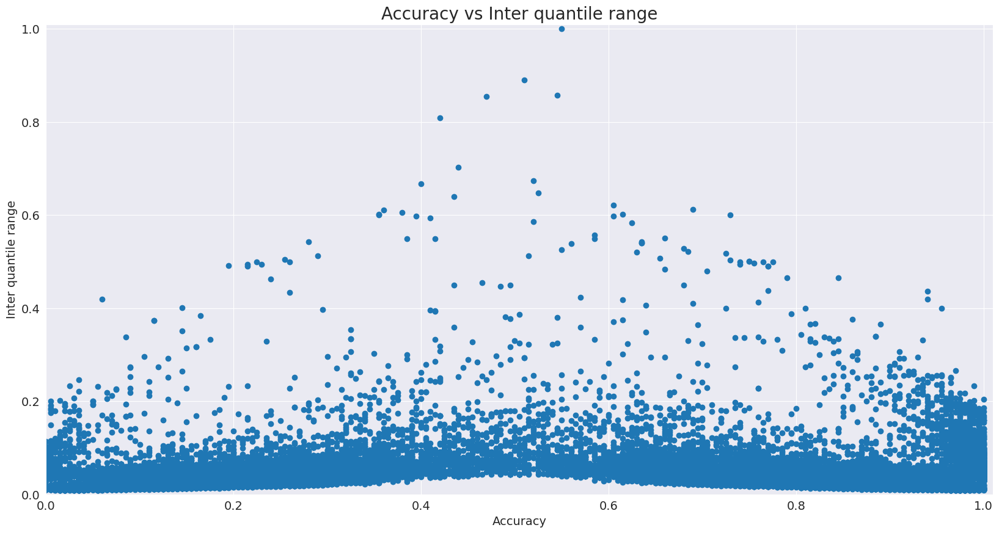

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.530463  0.531939  0.528890
disadv    0.543990  0.533599  0.548151
Accuracy -0.013527 -0.001659 -0.019261

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.047142  0.048329  0.045072
disadv            0.039447  0.051380  0.036210
Disparate_Impact  0.836762  1.063125  0.803377

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.047936  0.049301  0.045412
disadv             0.041799  0.052252  0.039283
Equal_Opportunity  0.006137 -0.002952  0.006129

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.100906  0.103791  0.096184
disadv             

In [47]:
imputation_technique = 'Mean'
mean_analyzer = get_analyzer(imputation_technique)
mean_analyzer.measure_metrics()

### Impute-by-mean-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


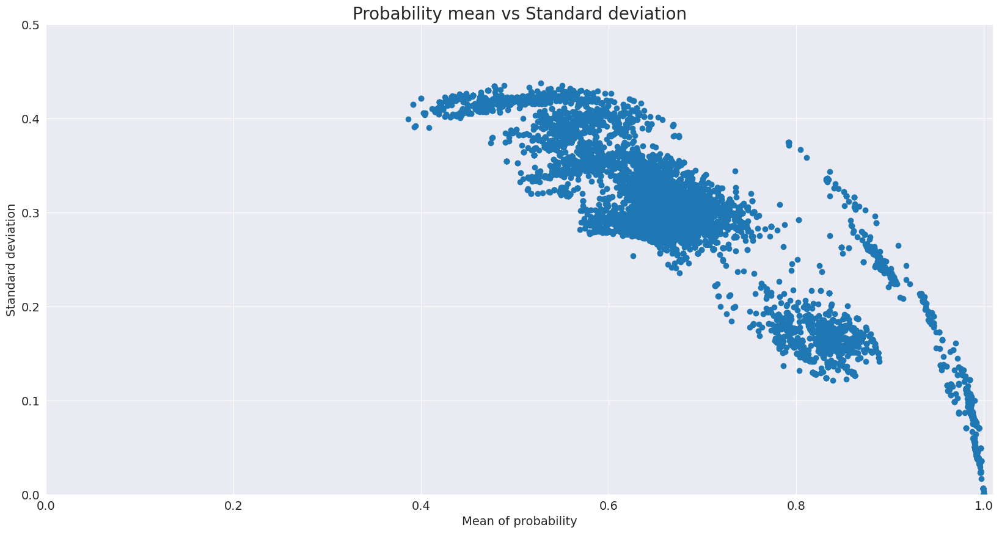

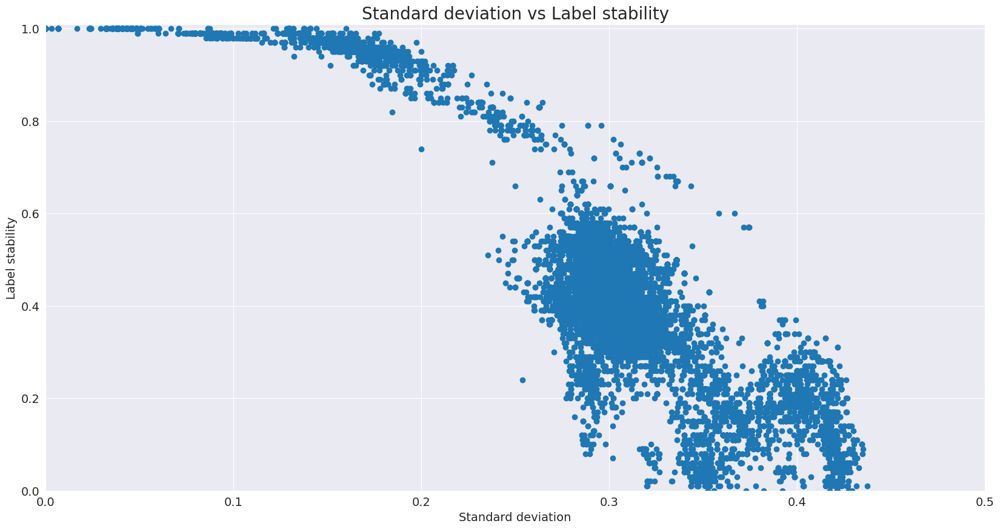

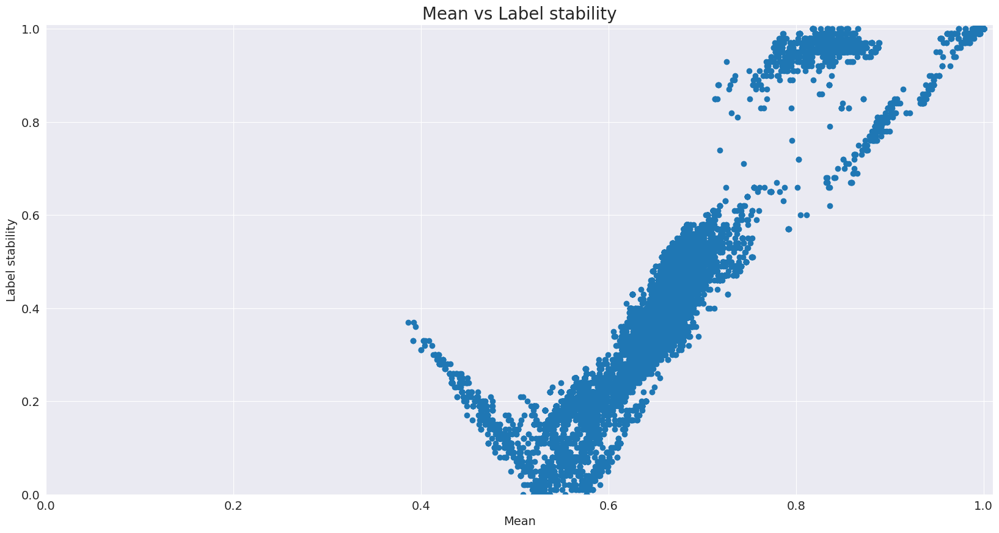

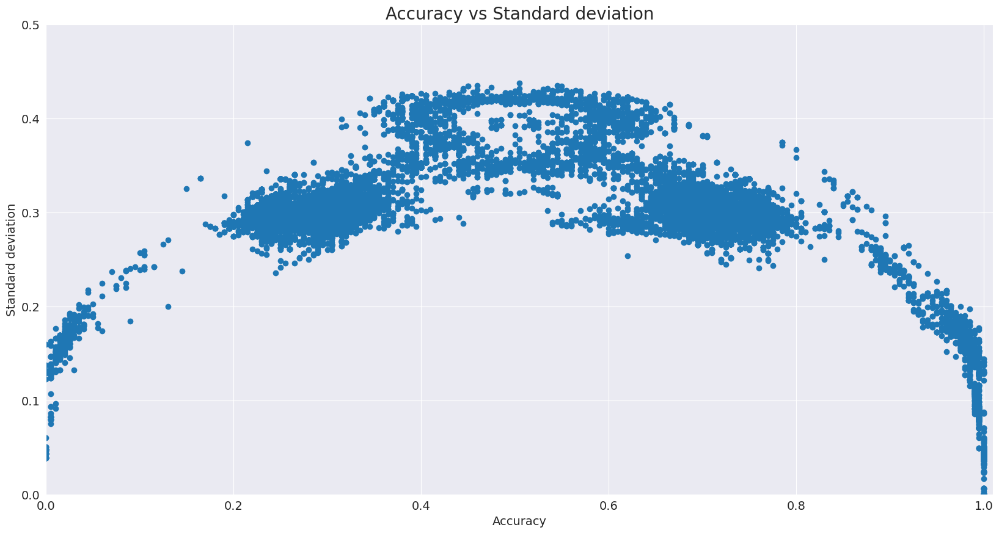

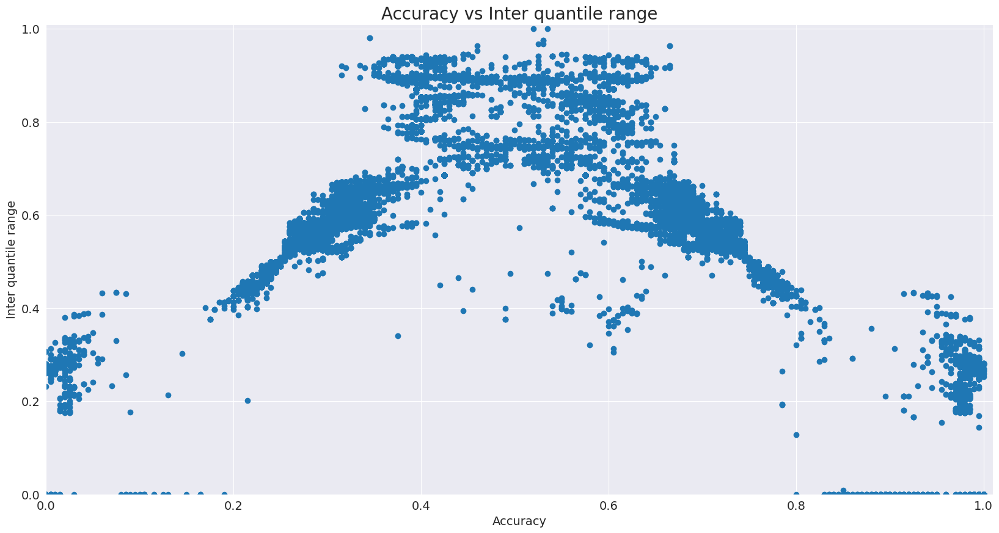

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.520912  0.503940  0.486996
disadv    0.582817  0.556833  0.562404
Accuracy -0.061905 -0.052893 -0.075408

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.020658  0.023009  0.028447
disadv            0.006609  0.011298  0.005778
Disparate_Impact  0.319909  0.491014  0.203120

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.014037  0.015078  0.018219
disadv             0.005473  0.008607  0.005296
Equal_Opportunity  0.008564  0.006471  0.012924

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.043798  0.047173  0.056568
disadv             

In [52]:
imputation_technique = 'Trimmed-mean'
trimmed_mean_analyzer = get_analyzer(imputation_technique)
trimmed_mean_analyzer.measure_metrics()

### Impute-by-mean-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


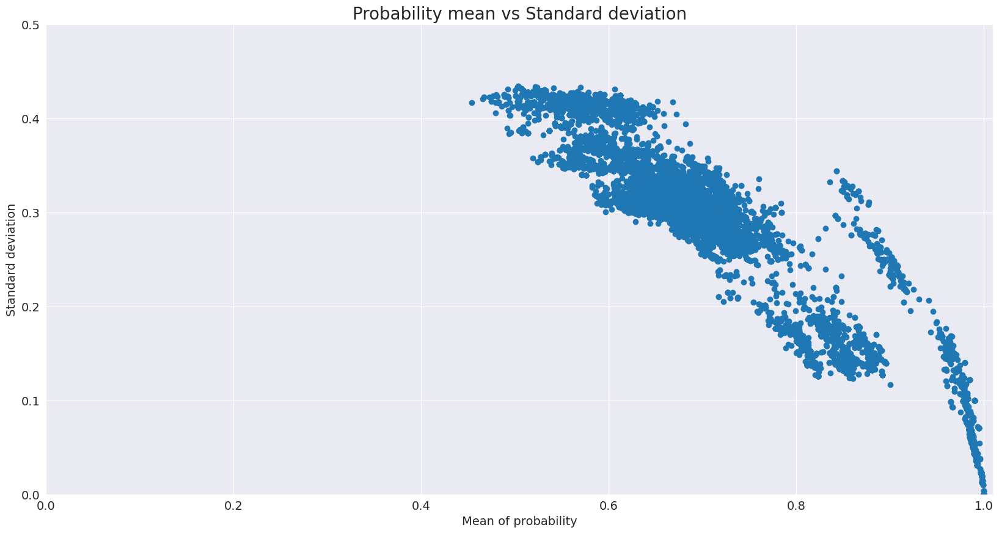

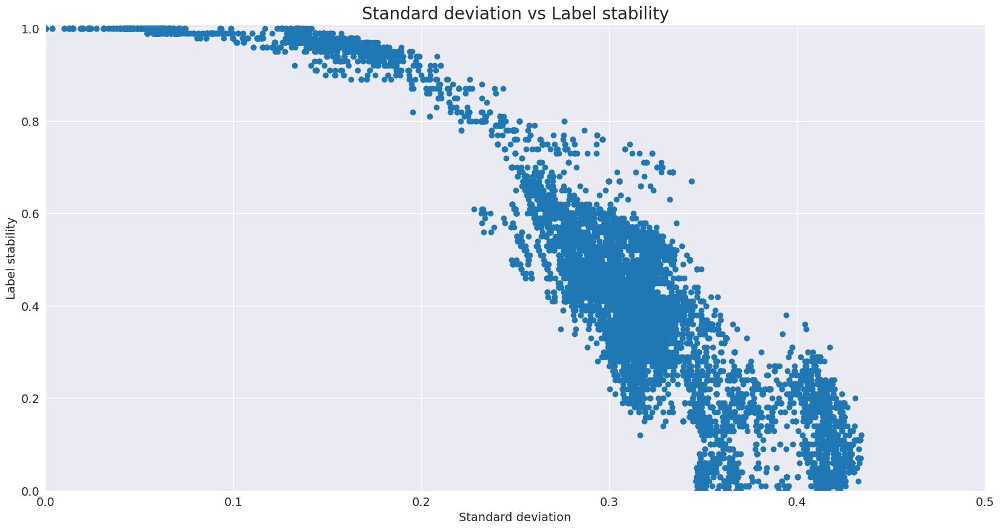

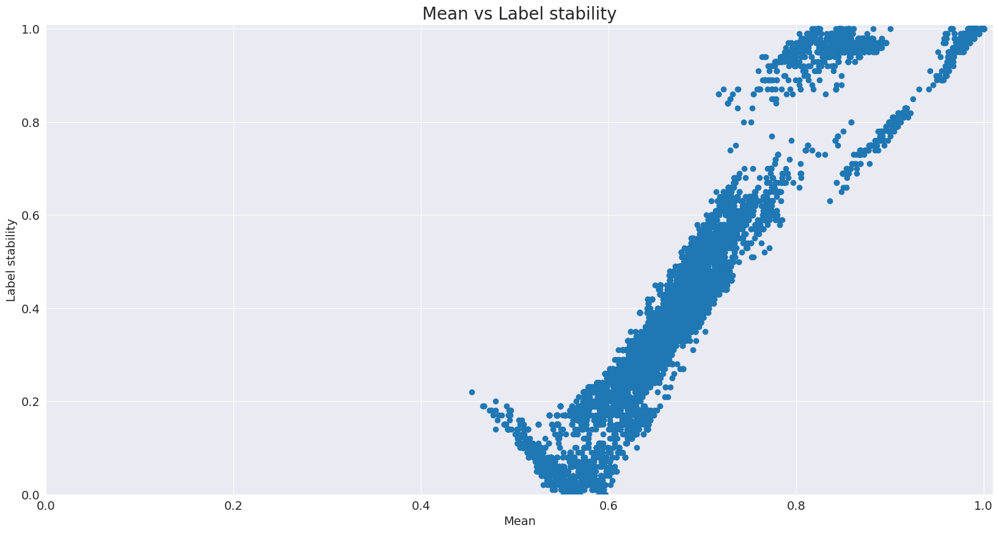

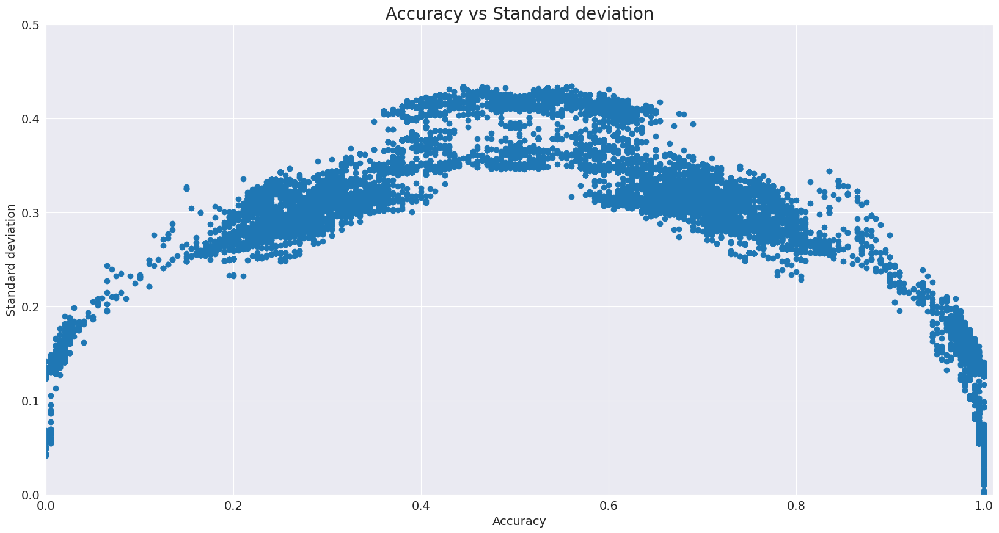

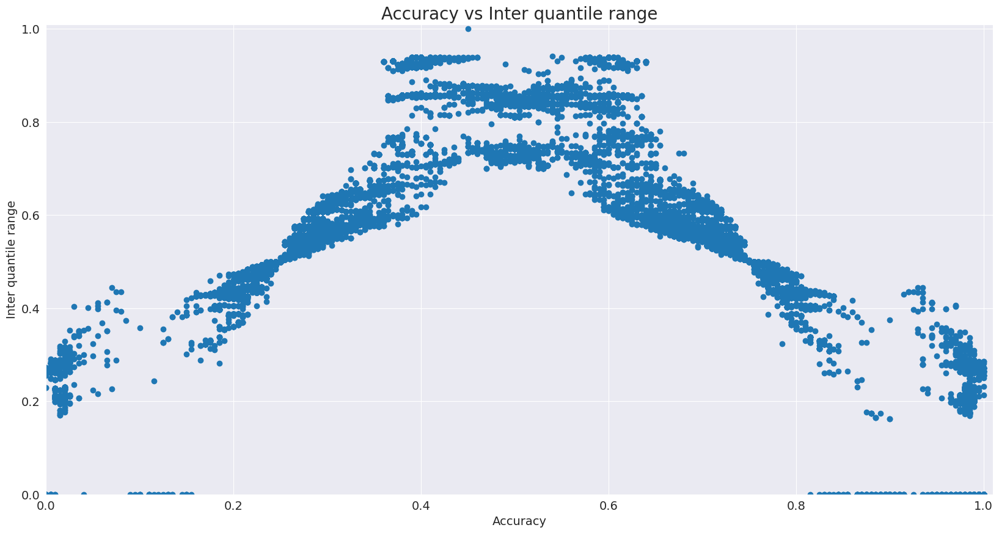

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527677  0.511452  0.496084
disadv    0.584882  0.560222  0.563559
Accuracy -0.057205 -0.048770 -0.067475

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000868  0.001523   0.00133
disadv            0.000000  0.000639   0.00000
Disparate_Impact  0.000000  0.419166   0.00000

#################### Equal_Opportunity ####################
                      Race       Sex  Race_Sex
adv                0.00023  0.000754  0.000294
disadv             0.00000  0.000335  0.000000
Equal_Opportunity  0.00023  0.000419  0.000294

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.001841  0.003123  0.002645
disadv                 

In [91]:
imputation_technique = 'Sex-conditional-mean'
sex_conditional_mean_analyzer = get_analyzer(imputation_technique)
sex_conditional_mean_analyzer.measure_metrics()

### Impute-by-mean-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


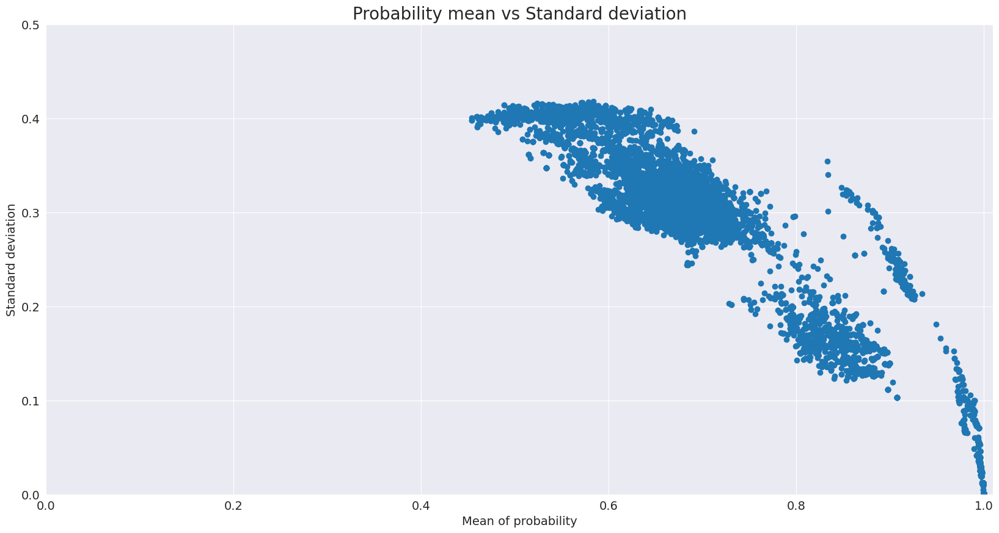

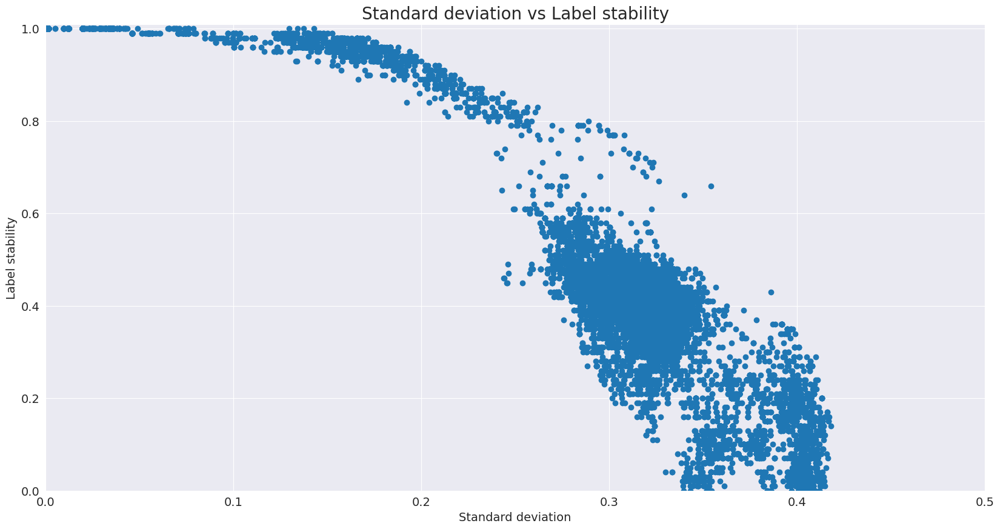

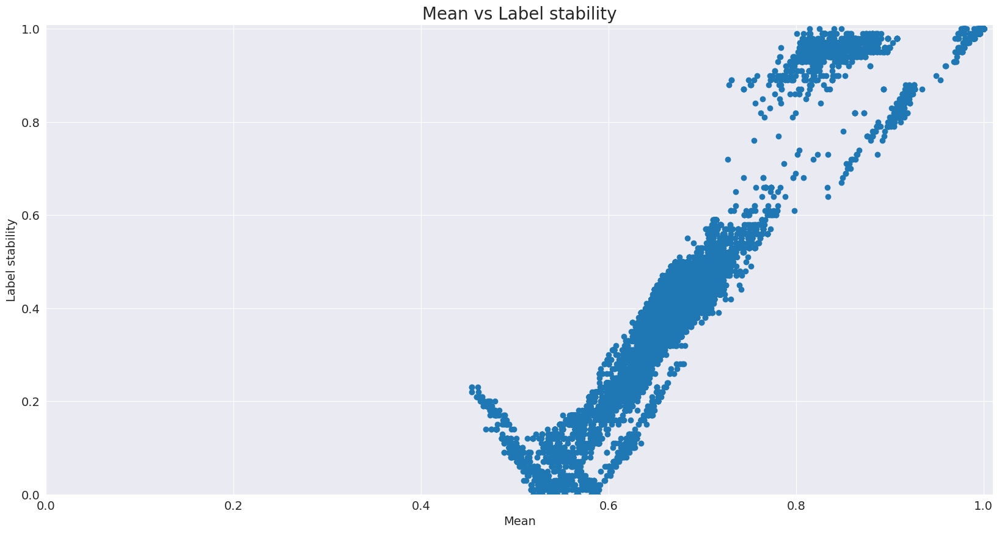

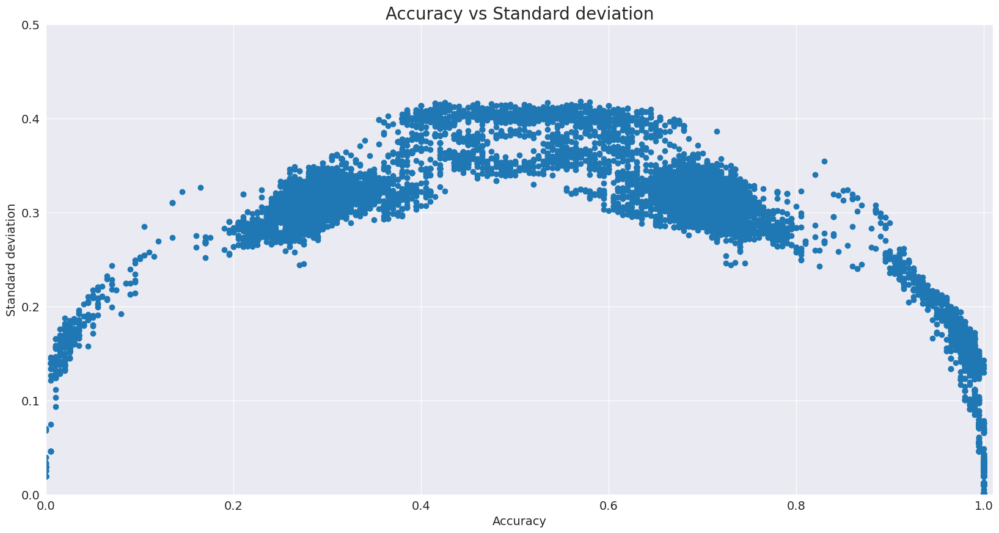

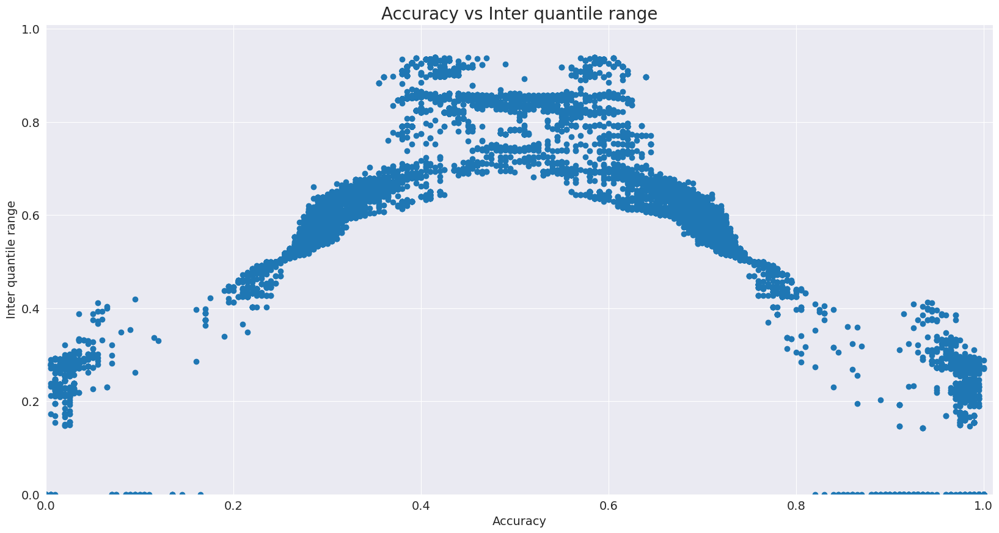

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.525977  0.510296  0.495123
disadv    0.584676  0.558699  0.563559
Accuracy -0.058699 -0.048403 -0.068436

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.006910  0.006777  0.007463
disadv            0.001033  0.005502  0.001541
Disparate_Impact  0.149434  0.811837  0.206471

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.004832  0.004954  0.005436
disadv             0.000995  0.004136  0.001765
Equal_Opportunity  0.003837  0.000818  0.003671

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.014651  0.013893  0.014840
disadv             

In [92]:
imputation_technique = 'Race-conditional-mean'
race_conditional_mean_analyzer = get_analyzer(imputation_technique)
race_conditional_mean_analyzer.measure_metrics()

### Impute-by-median technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


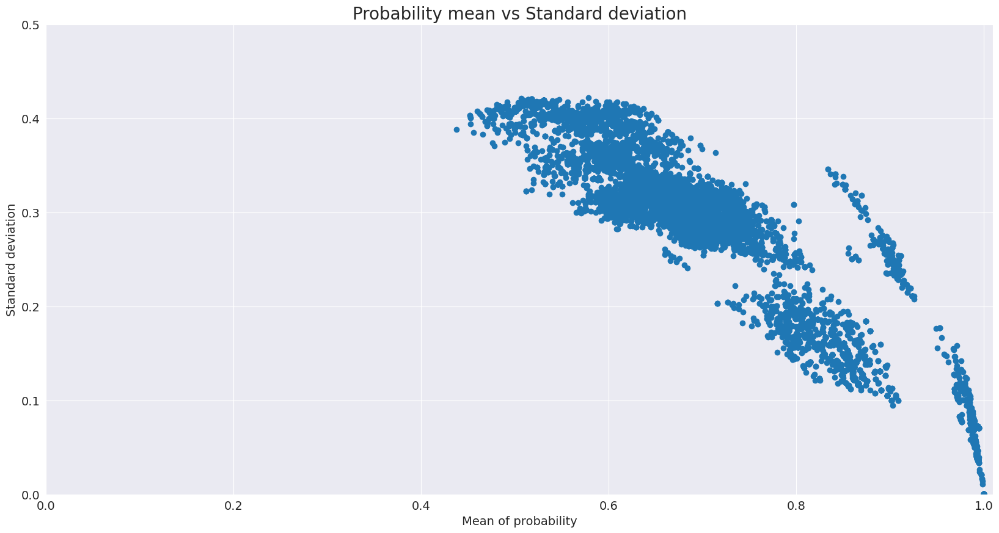

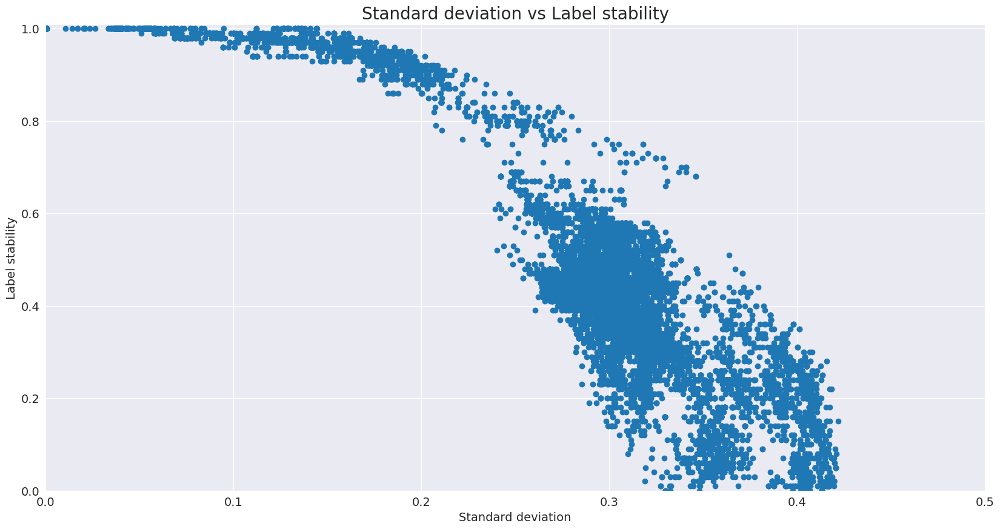

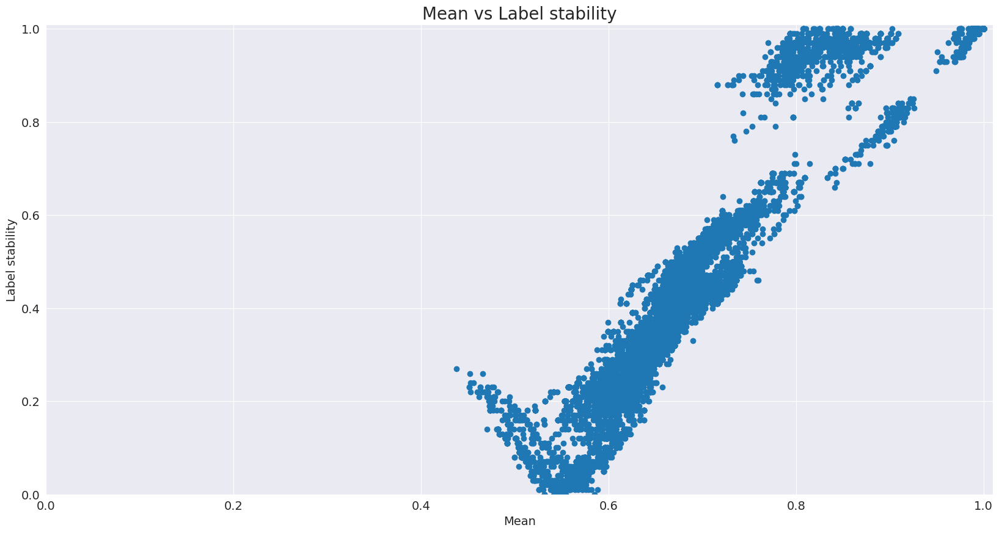

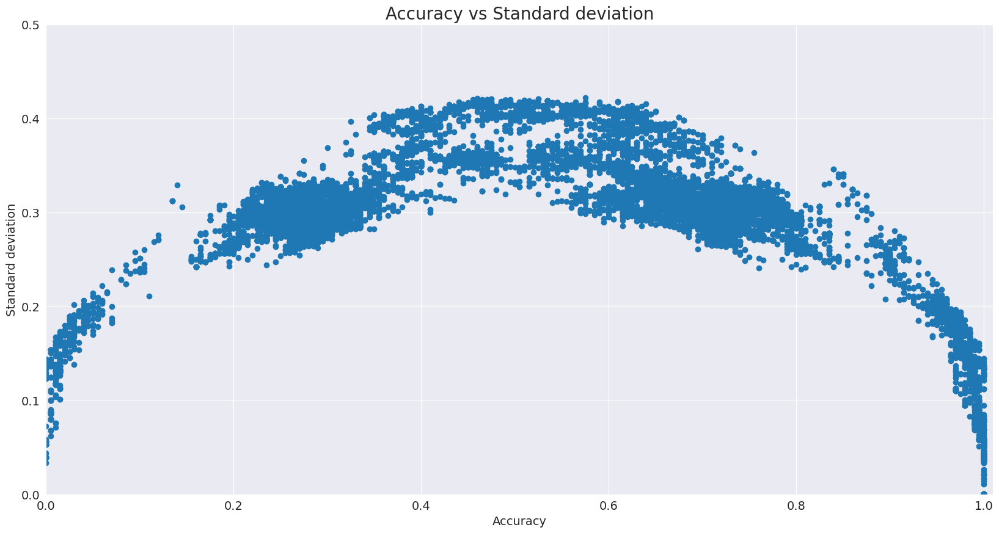

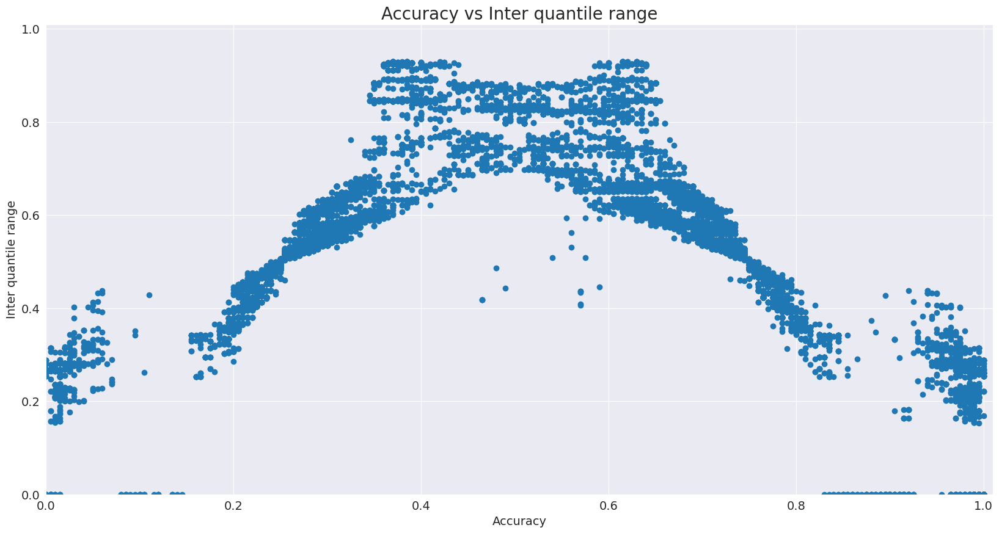

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527026  0.510769  0.495788
disadv    0.584676  0.559338  0.563559
Accuracy -0.057650 -0.048569 -0.067771

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.003907  0.004308  0.004138
disadv            0.001033  0.003389  0.000770
Disparate_Impact  0.264277  0.786821  0.186193

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.002761  0.002908  0.002792
disadv             0.000995  0.002459  0.000883
Equal_Opportunity  0.001766  0.000449  0.001909

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.008284  0.008831  0.008228
disadv             

In [93]:
imputation_technique = 'Median'
median_analyzer = get_analyzer(imputation_technique)
median_analyzer.measure_metrics()

### Impute-by-median-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


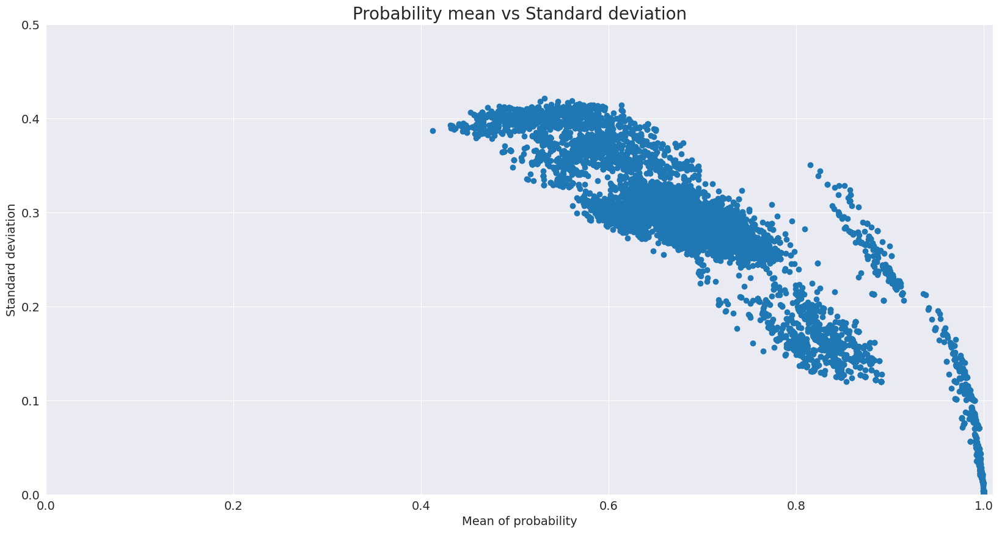

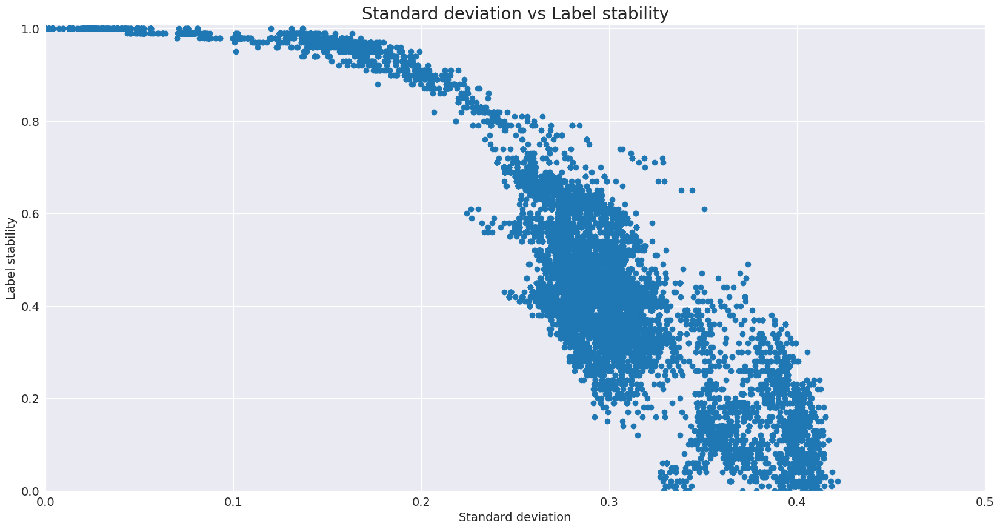

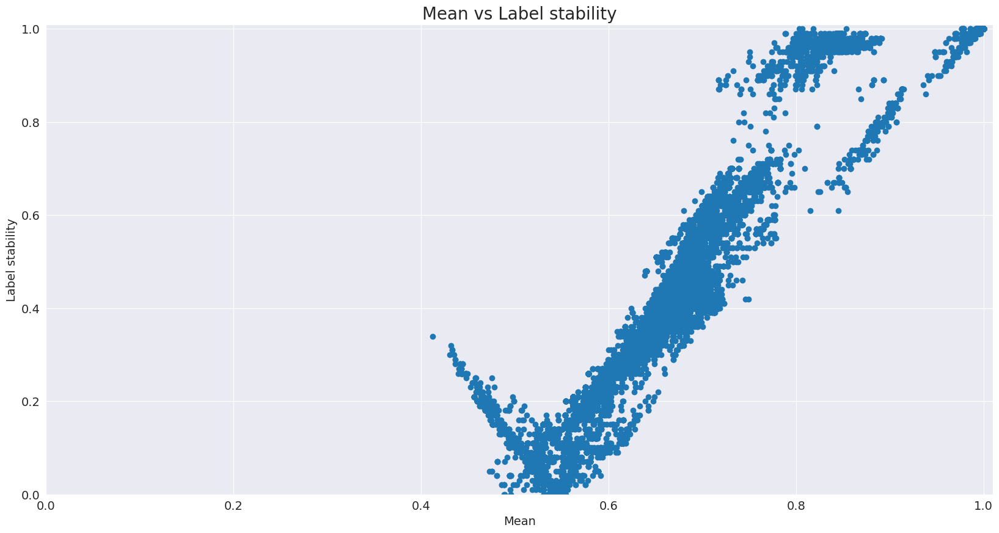

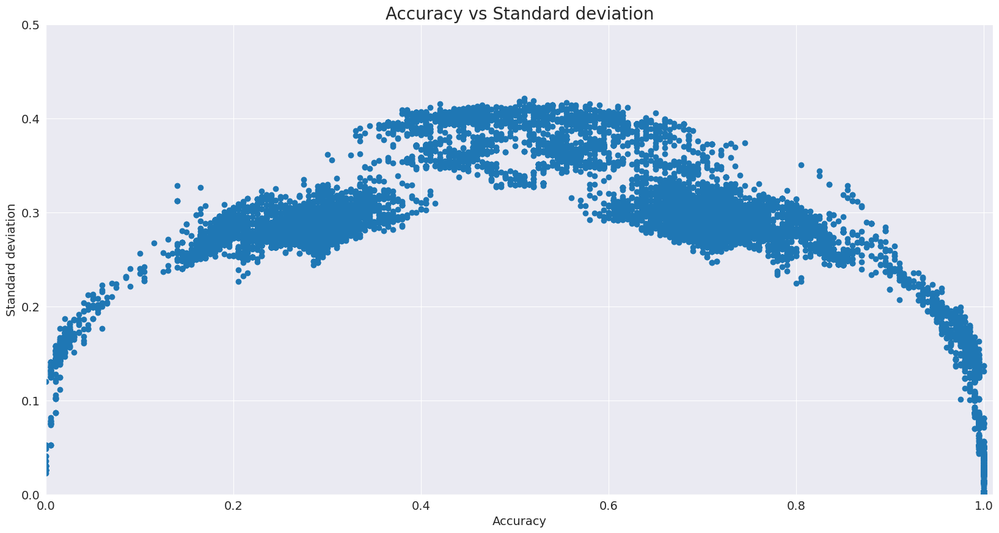

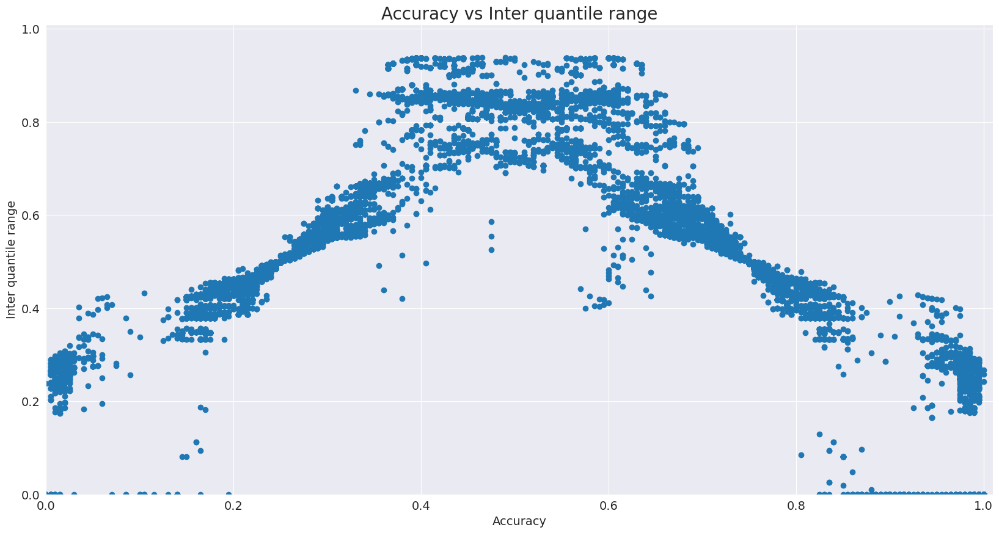

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.523155  0.507985  0.491798
disadv    0.584469  0.556931  0.563174
Accuracy -0.061314 -0.048946 -0.071376

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.018632  0.018754  0.023201
disadv            0.002478  0.011494  0.002696
Disparate_Impact  0.133011  0.612898  0.116222

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.014267  0.014863  0.017778
disadv             0.002488  0.008943  0.002648
Equal_Opportunity  0.011780  0.005920  0.015131

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.039503  0.038449  0.046136
disadv             

In [94]:
imputation_technique = 'Trimmed-median'
trimmed_median_analyzer = get_analyzer(imputation_technique)
trimmed_median_analyzer.measure_metrics()

### Impute-by-median-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


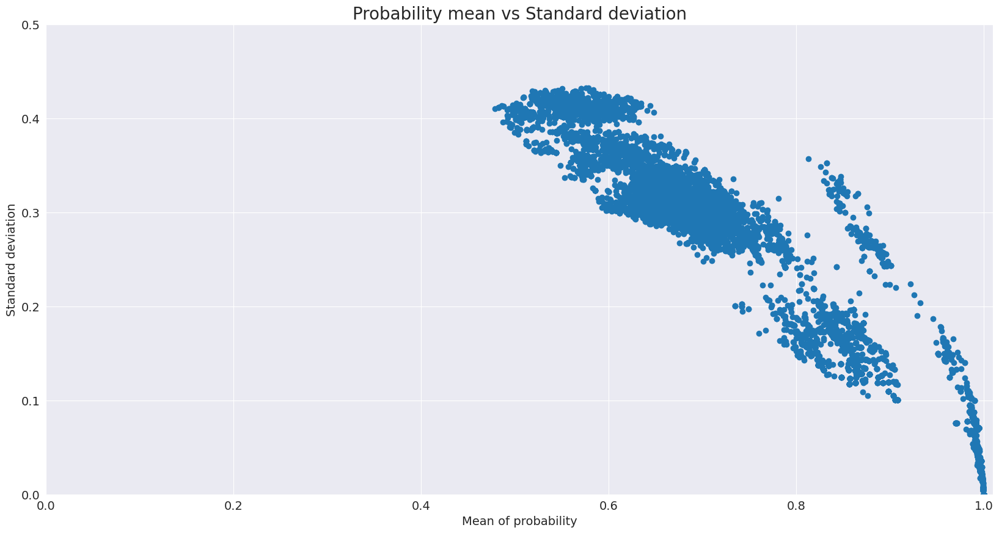

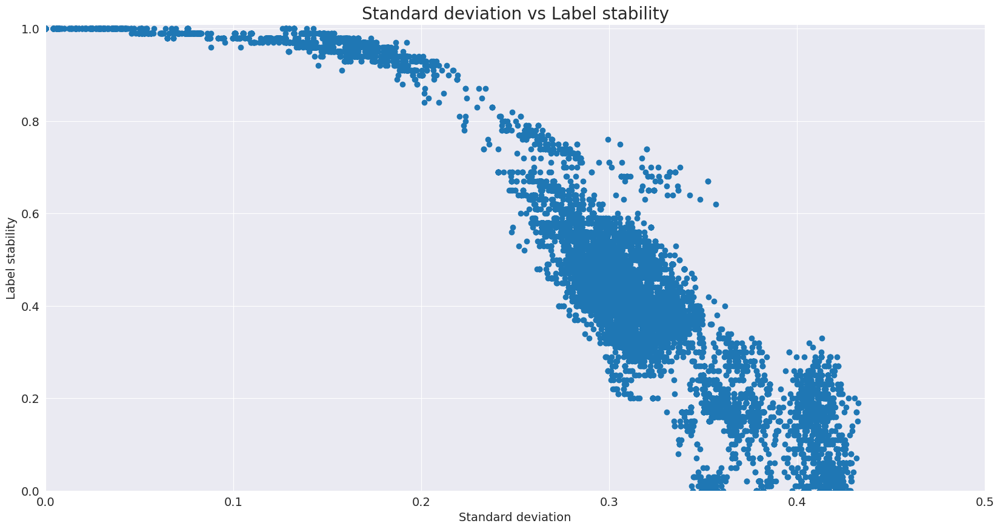

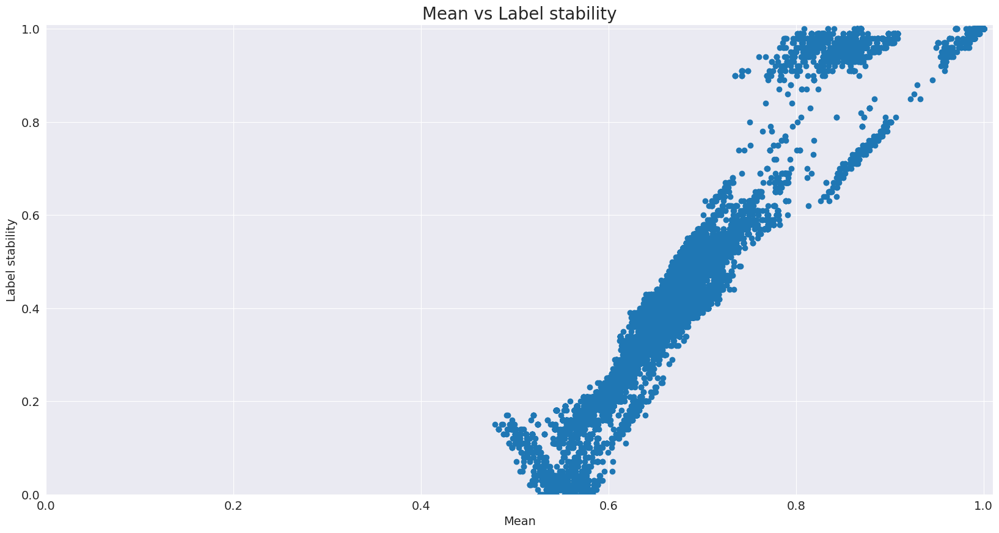

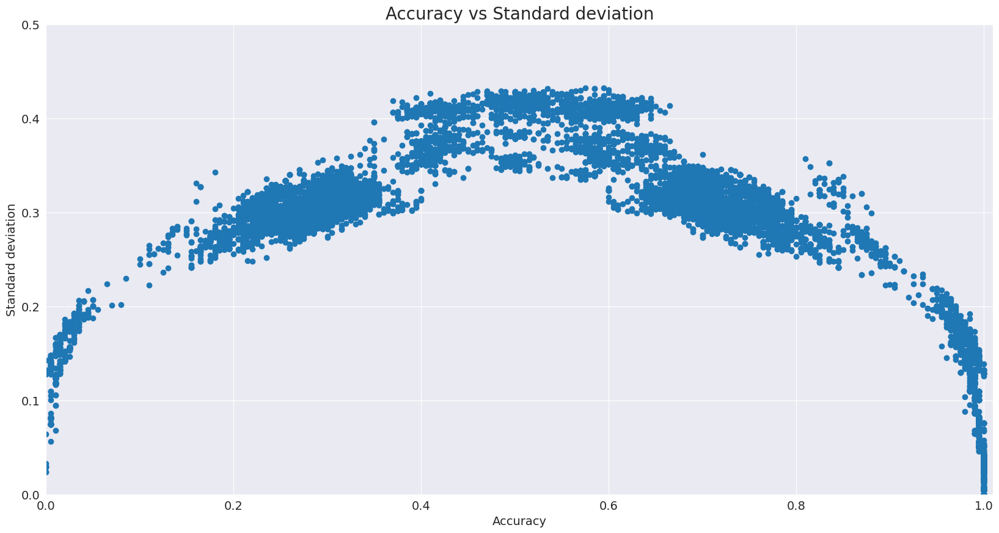

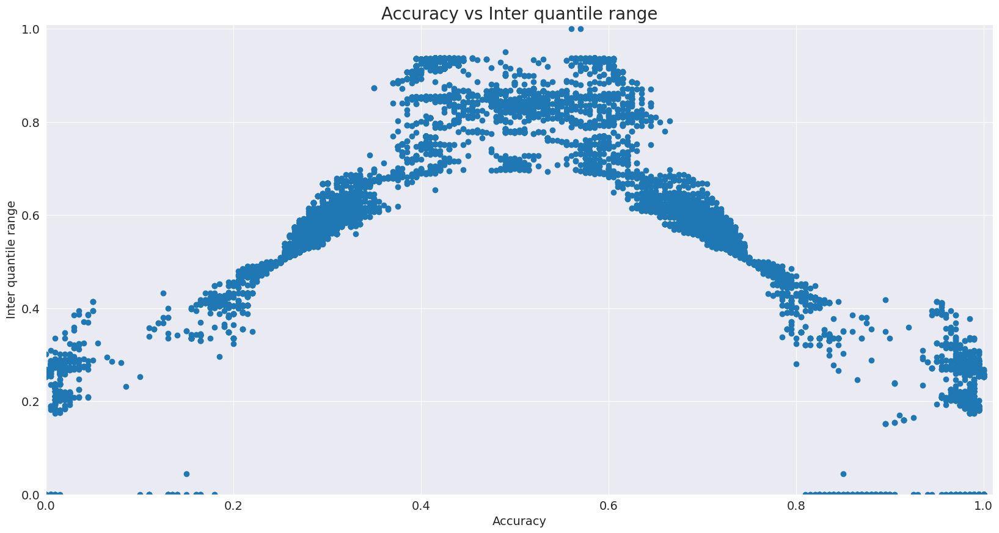

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527858  0.511715  0.496749
disadv    0.585089  0.560075  0.563559
Accuracy -0.057231 -0.048360 -0.066810

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000687  0.000630  0.000369
disadv            0.000207  0.001179  0.000000
Disparate_Impact  0.300441  1.870125  0.000000

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.000230  0.000108       0.0
disadv             0.000498  0.000782       0.0
Equal_Opportunity -0.000267 -0.000675       0.0

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.001457  0.001292  0.000735
disadv             

In [95]:
imputation_technique = 'Sex-conditional-median'
sex_conditional_median_analyzer = get_analyzer(imputation_technique)
sex_conditional_median_analyzer.measure_metrics()

### Impute-by-median-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


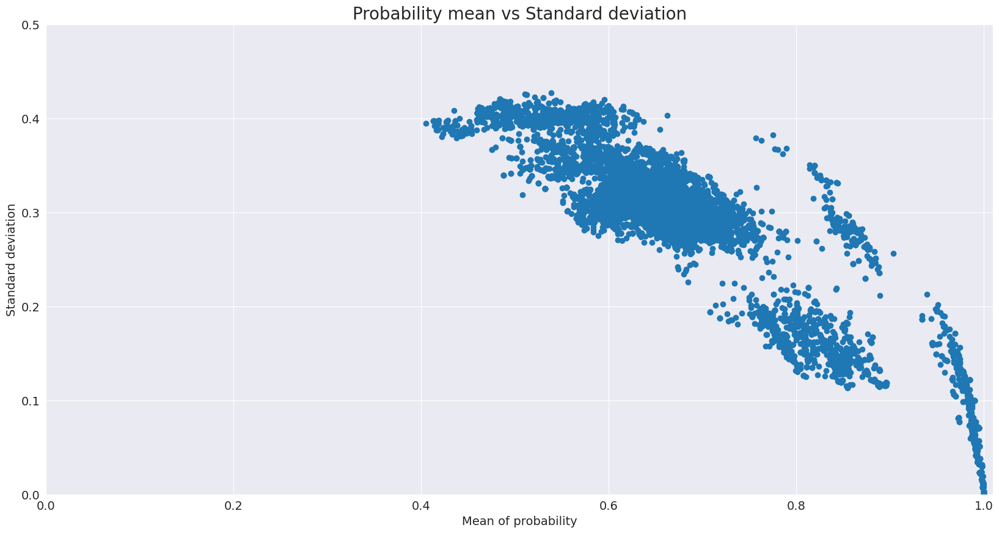

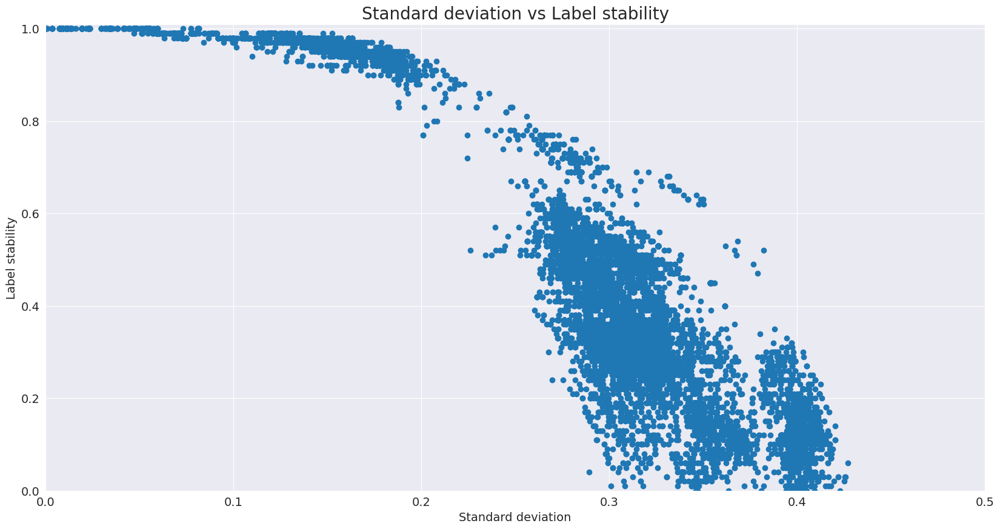

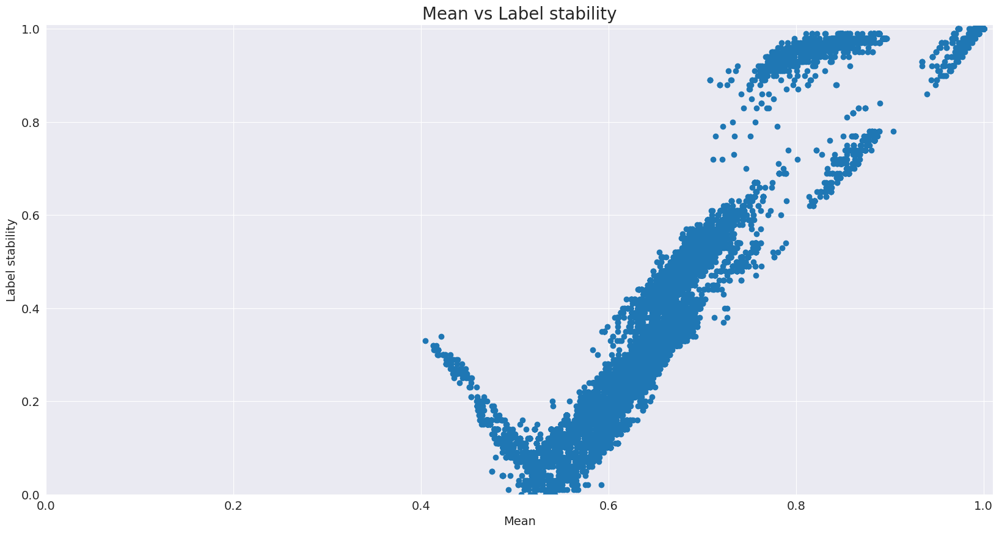

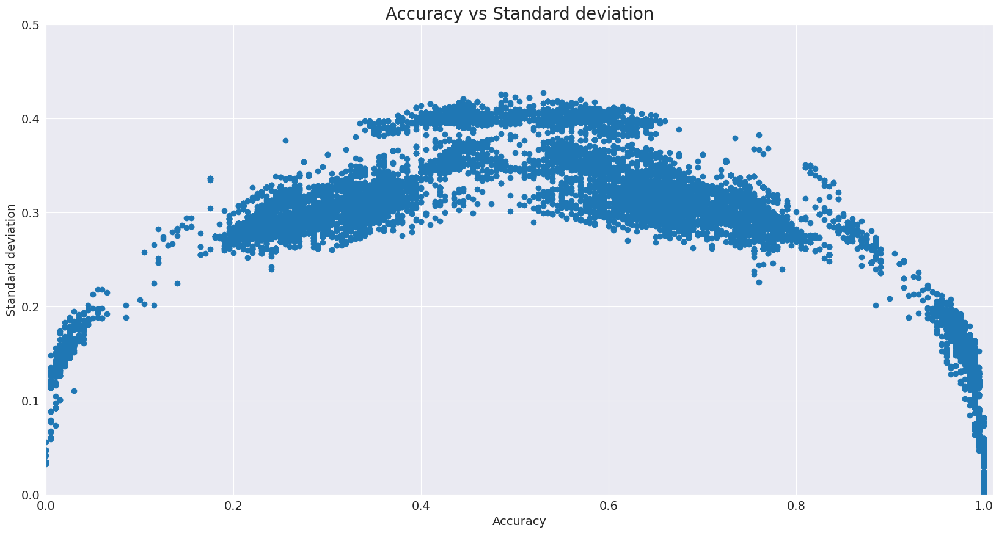

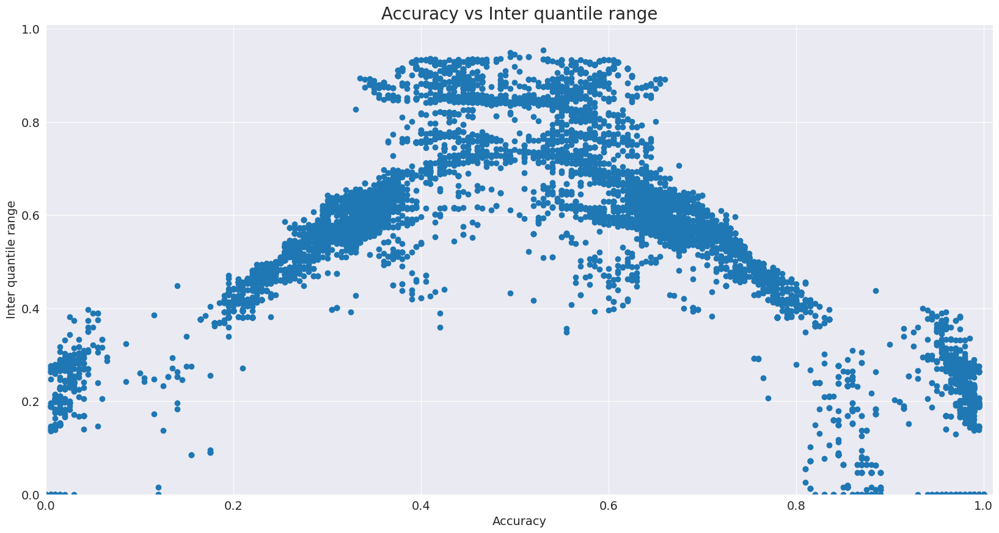

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.520116  0.503940  0.486700
disadv    0.583643  0.555801  0.562404
Accuracy -0.063527 -0.051861 -0.075704

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.020297  0.020698  0.025787
disadv            0.004131  0.012526  0.005008
Disparate_Impact  0.203507  0.605180  0.194196

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.012810  0.012709  0.015281
disadv             0.003483  0.008831  0.004413
Equal_Opportunity  0.009327  0.003878  0.010868

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.043031  0.042434  0.051278
disadv             

In [96]:
imputation_technique = 'Race-conditional-median'
race_conditional_median_analyzer = get_analyzer(imputation_technique)
race_conditional_median_analyzer.measure_metrics()

## Display result plots

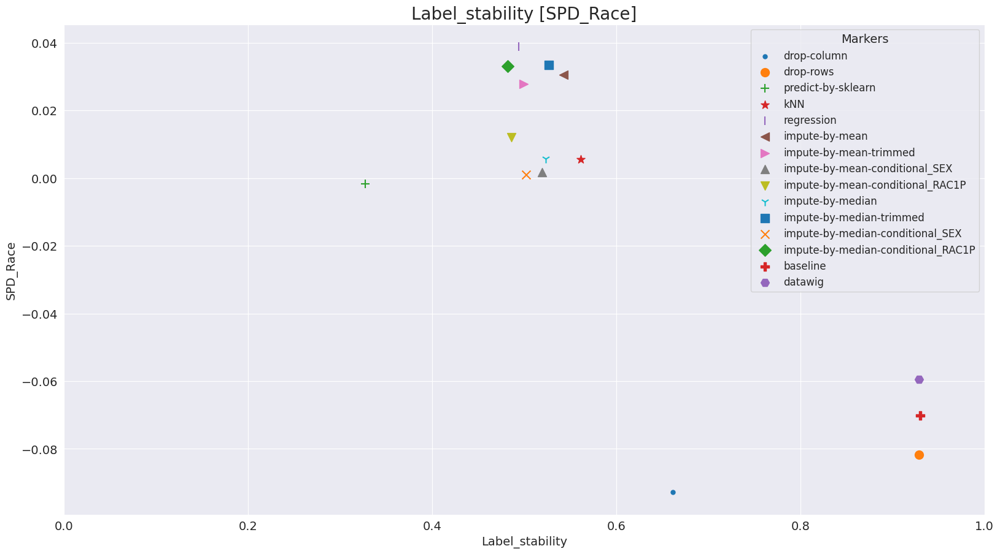

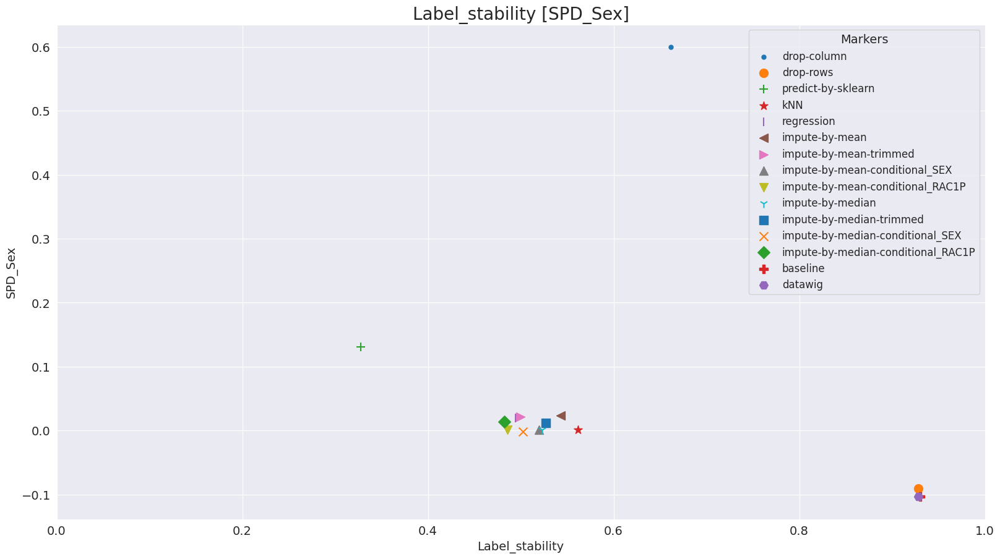

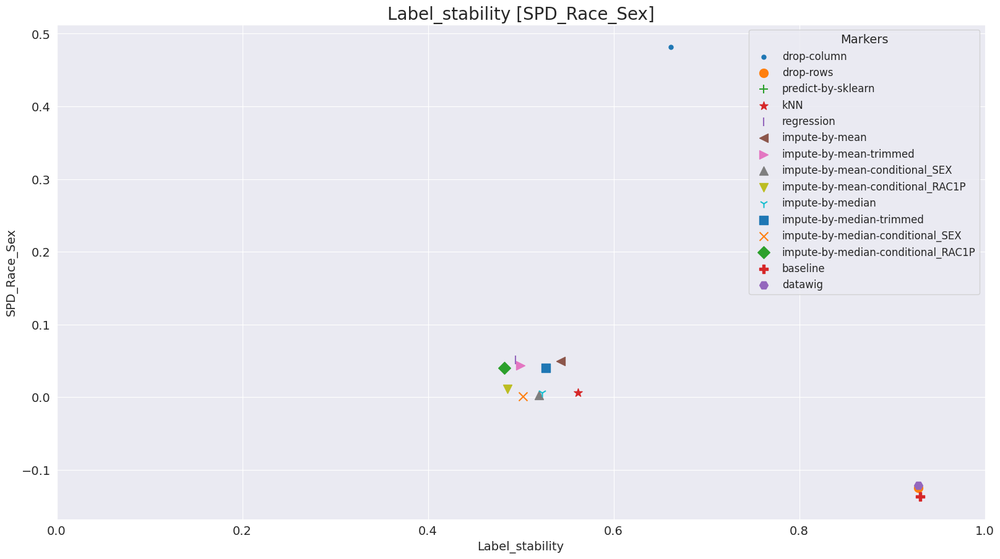

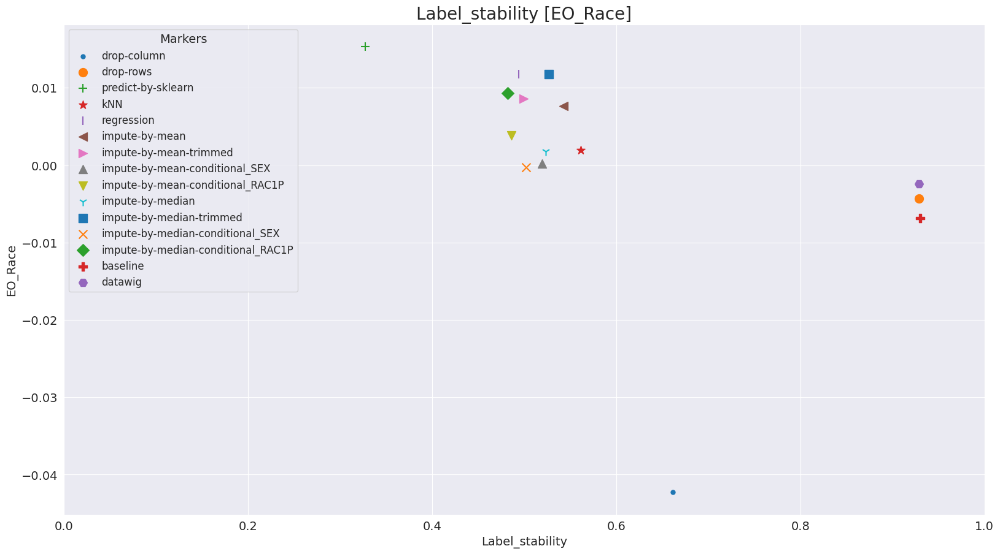

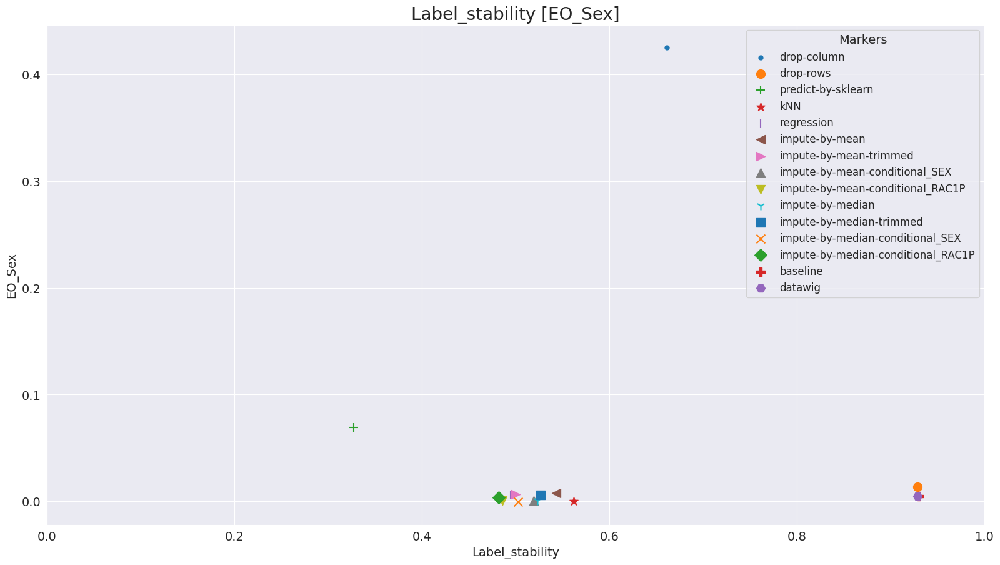

...

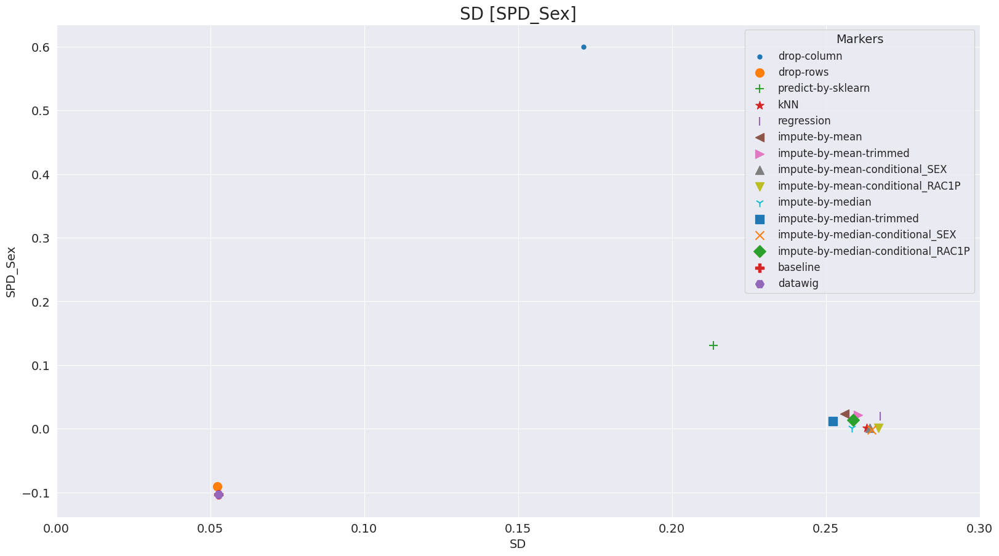

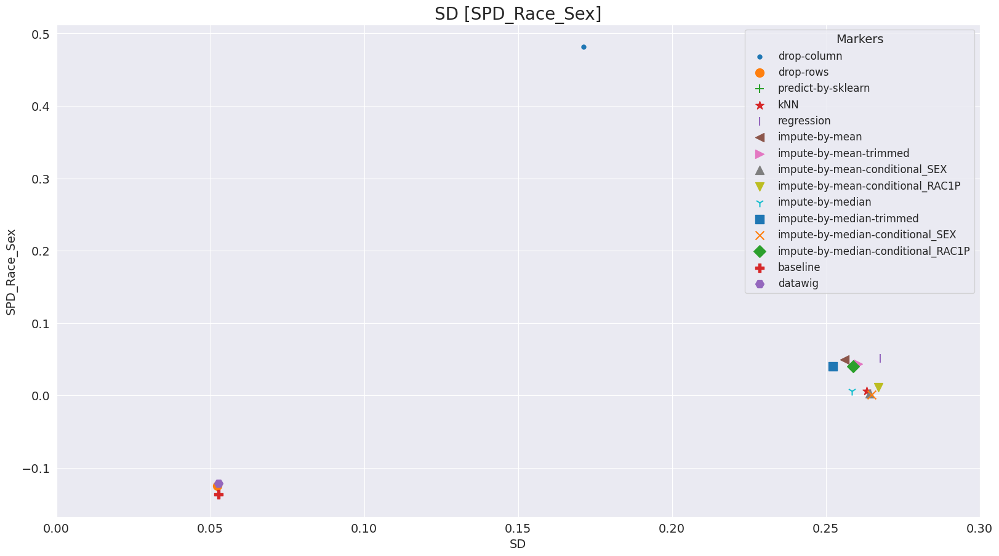

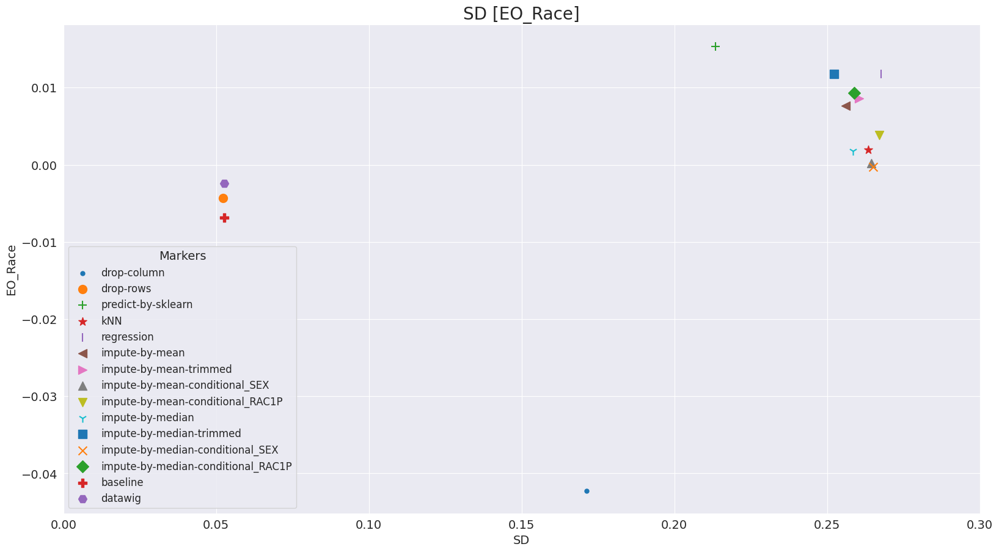

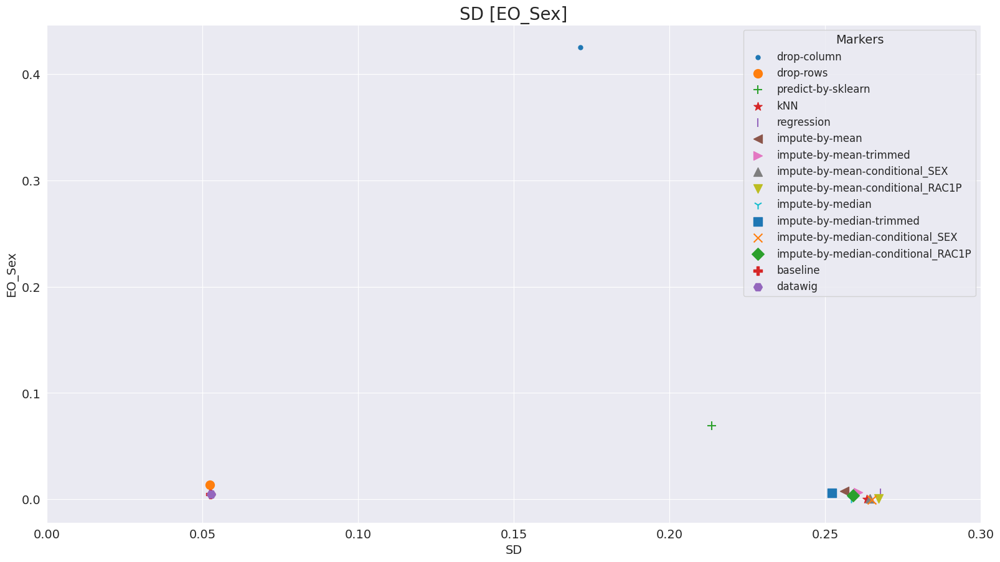

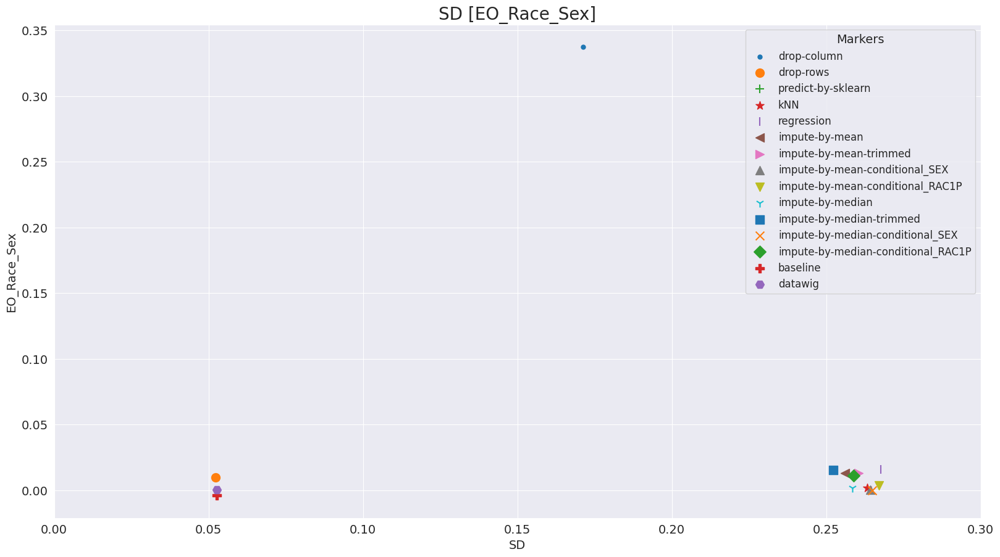

In [53]:
display_result_plots(NULL_SCENARIO_NAME, imputation_techniques)